In [10]:
# # example of loading the mnist dataset
# from keras.datasets.mnist import load_data
# from matplotlib import pyplot
# # load the images into memory
# (trainX, trainy), (testX, testy) = load_data()
# # plot images from the training dataset
# for i in range(25):
# 	# define subplot
# 	pyplot.subplot(5, 5, 1 + i)
# 	# turn off axis
# 	pyplot.axis('off')
# 	# plot raw pixel data
# 	pyplot.imshow(trainX[i], cmap='gray_r')
# pyplot.show()


#import dependencies

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [11]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

In [12]:
# Define hyperparameters
num_epochs = 100
batch_size = 64
learning_rate = 0.0002
image_size = 28
image_channels = 1
latent_dim = 100

In [13]:
# Create a custom dataset for MNIST
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

mnist_dataset = datasets.MNIST(root='./data',
                               train=True,
                               transform=transform,
                               download=True)

data_loader = DataLoader(dataset=mnist_dataset,
                         batch_size=batch_size,
                         shuffle=True)


In [14]:
# Define the generator network
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, 7, 1, 0),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, image_channels, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)

In [15]:
# Define the discriminator network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(image_channels, 128, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 7, 1, 0),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

In [16]:
# Initialize the generator and discriminator
generator = Generator().cuda()
discriminator = Discriminator().cuda()

In [17]:
# Define loss and optimizers
criterion = nn.BCELoss()
optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate)

Epoch [1/100], Batch [100/938], D_real: 0.9977, D_fake: 0.0000, Loss_D: 0.0023, Loss_G: 12.9093
Epoch [1/100], Batch [200/938], D_real: 0.9972, D_fake: 0.0000, Loss_D: 0.0028, Loss_G: 14.2218
Epoch [1/100], Batch [300/938], D_real: 0.9995, D_fake: 0.0006, Loss_D: 0.0011, Loss_G: 7.7488
Epoch [1/100], Batch [400/938], D_real: 0.9999, D_fake: 0.0001, Loss_D: 0.0002, Loss_G: 9.4854
Epoch [1/100], Batch [500/938], D_real: 0.9999, D_fake: 0.0001, Loss_D: 0.0002, Loss_G: 9.2972
Epoch [1/100], Batch [600/938], D_real: 0.9981, D_fake: 0.0000, Loss_D: 0.0019, Loss_G: 19.4768
Epoch [1/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0046, Loss_D: 0.0046, Loss_G: 6.3542
Epoch [1/100], Batch [800/938], D_real: 0.9999, D_fake: 0.0006, Loss_D: 0.0006, Loss_G: 8.3062
Epoch [1/100], Batch [900/938], D_real: 0.9999, D_fake: 0.0003, Loss_D: 0.0004, Loss_G: 8.3537


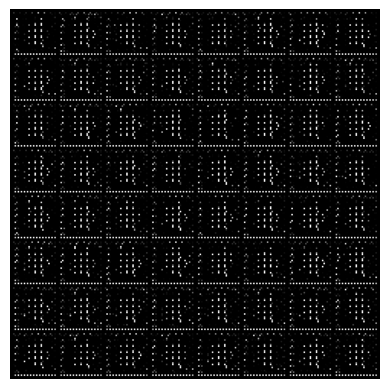

Epoch [2/100], Batch [100/938], D_real: 0.9997, D_fake: 0.0001, Loss_D: 0.0004, Loss_G: 9.3707
Epoch [2/100], Batch [200/938], D_real: 0.9999, D_fake: 0.0001, Loss_D: 0.0002, Loss_G: 9.7549
Epoch [2/100], Batch [300/938], D_real: 0.9999, D_fake: 0.0001, Loss_D: 0.0001, Loss_G: 9.9068
Epoch [2/100], Batch [400/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 10.2703
Epoch [2/100], Batch [500/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 10.5755
Epoch [2/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 10.4992
Epoch [2/100], Batch [700/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 10.6444
Epoch [2/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 10.8941
Epoch [2/100], Batch [900/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 11.1417


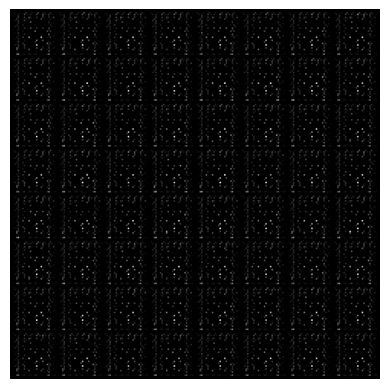

Epoch [3/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.2389
Epoch [3/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.3913
Epoch [3/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.5186
Epoch [3/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.4820
Epoch [3/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.5387
Epoch [3/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.6329
Epoch [3/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.0841
Epoch [3/100], Batch [800/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 11.7510
Epoch [3/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.1164


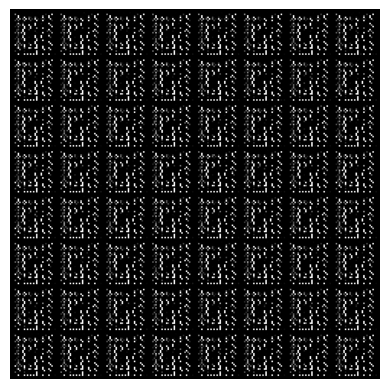

Epoch [4/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.4858
Epoch [4/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.6979
Epoch [4/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.8566
Epoch [4/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.9768
Epoch [4/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.0804
Epoch [4/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.4963
Epoch [4/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.2566
Epoch [4/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.4770
Epoch [4/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.8157


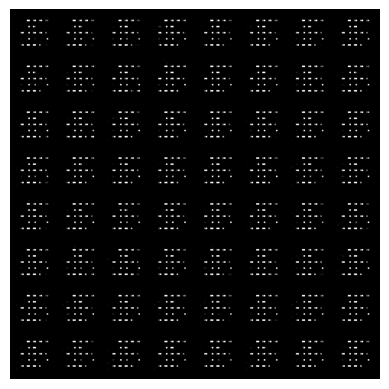

Epoch [5/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.1599
Epoch [5/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.4478
Epoch [5/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.5692
Epoch [5/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.6215
Epoch [5/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.8228
Epoch [5/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.7288
Epoch [5/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.6900
Epoch [5/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.7560
Epoch [5/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.9543


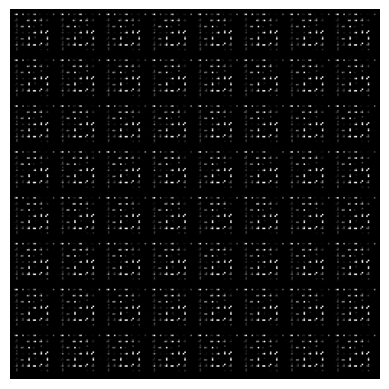

Epoch [6/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.1771
Epoch [6/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.1547
Epoch [6/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.1790
Epoch [6/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.1652
Epoch [6/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.3610
Epoch [6/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.5071
Epoch [6/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.6402
Epoch [6/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.7241
Epoch [6/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.7782


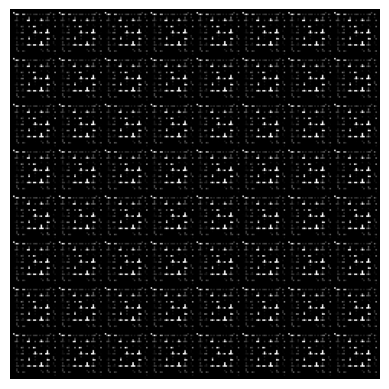

Epoch [7/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.8534
Epoch [7/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.9558
Epoch [7/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.6778
Epoch [7/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.9084
Epoch [7/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.2093
Epoch [7/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.3970
Epoch [7/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.5489
Epoch [7/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.6813
Epoch [7/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.7446


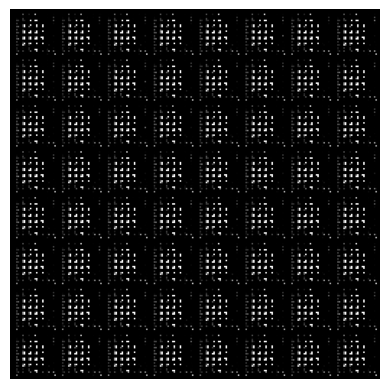

Epoch [8/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.8539
Epoch [8/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.0504
Epoch [8/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 32.9230
Epoch [8/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 31.5858
Epoch [8/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 19.1794
Epoch [8/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 16.2518
Epoch [8/100], Batch [700/938], D_real: 0.9999, D_fake: 0.0003, Loss_D: 0.0003, Loss_G: 21.5662
Epoch [8/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0001, Loss_D: 0.0001, Loss_G: 20.6907
Epoch [8/100], Batch [900/938], D_real: 0.9998, D_fake: 0.0000, Loss_D: 0.0002, Loss_G: 26.9150


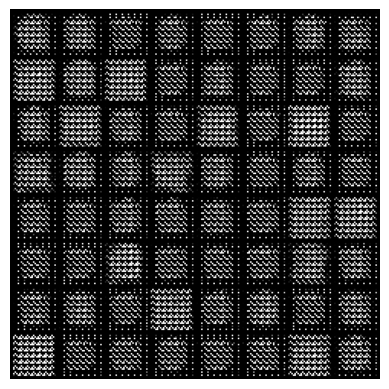

Epoch [9/100], Batch [100/938], D_real: 0.9996, D_fake: 0.0000, Loss_D: 0.0004, Loss_G: 18.2558
Epoch [9/100], Batch [200/938], D_real: 0.9737, D_fake: 0.0000, Loss_D: 0.0363, Loss_G: 30.4848
Epoch [9/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 23.6375
Epoch [9/100], Batch [400/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 21.8431
Epoch [9/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 20.1905
Epoch [9/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 17.0147
Epoch [9/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 15.0941
Epoch [9/100], Batch [800/938], D_real: 0.9890, D_fake: 0.0000, Loss_D: 0.0164, Loss_G: 44.9145
Epoch [9/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.1807


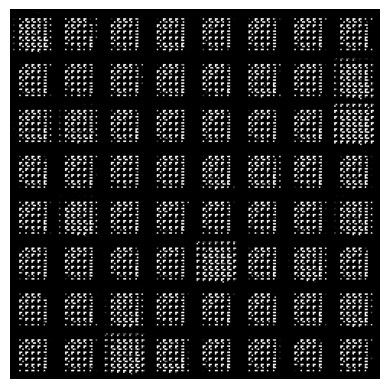

Epoch [10/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.1966
Epoch [10/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.1764
Epoch [10/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.3368
Epoch [10/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.0661
Epoch [10/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.0066
Epoch [10/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.1977
Epoch [10/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.9014
Epoch [10/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.9420
Epoch [10/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.3679


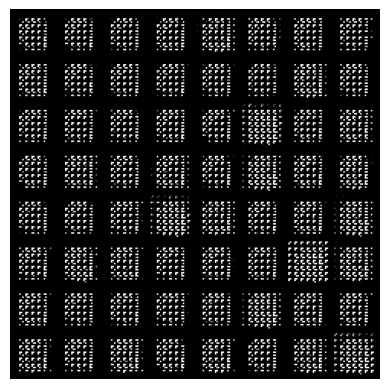

Epoch [11/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.2842
Epoch [11/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.2666
Epoch [11/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.3559
Epoch [11/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.0657
Epoch [11/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.2888
Epoch [11/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.3242
Epoch [11/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.6026
Epoch [11/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 46.0414
Epoch [11/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.2111


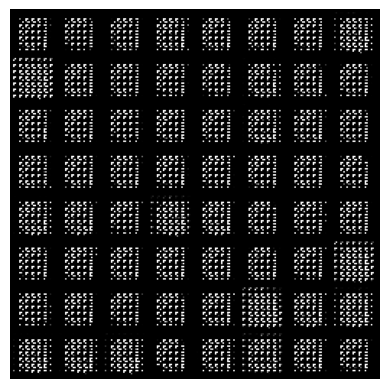

Epoch [12/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.1912
Epoch [12/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.3857
Epoch [12/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.6170
Epoch [12/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.3245
Epoch [12/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.7403
Epoch [12/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.0747
Epoch [12/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.2447
Epoch [12/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.8969
Epoch [12/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.2477


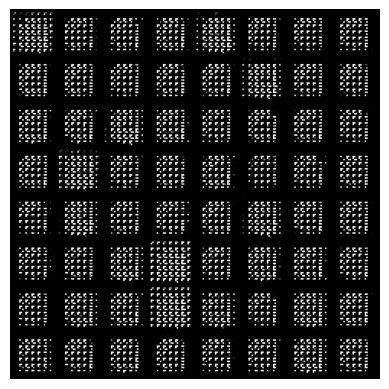

Epoch [13/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.8951
Epoch [13/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.9266
Epoch [13/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.5923
Epoch [13/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.3610
Epoch [13/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.4286
Epoch [13/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.6755
Epoch [13/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 45.0420
Epoch [13/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.7431
Epoch [13/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.7113


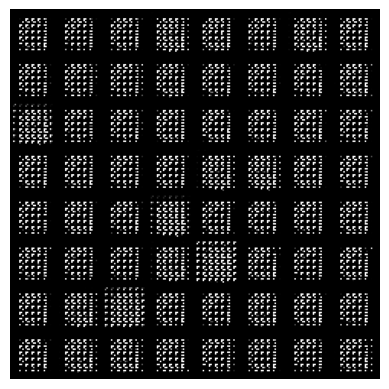

Epoch [14/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.5158
Epoch [14/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.8674
Epoch [14/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.7988
Epoch [14/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.7656
Epoch [14/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.5965
Epoch [14/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0762
Epoch [14/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.4643
Epoch [14/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0947
Epoch [14/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.5026


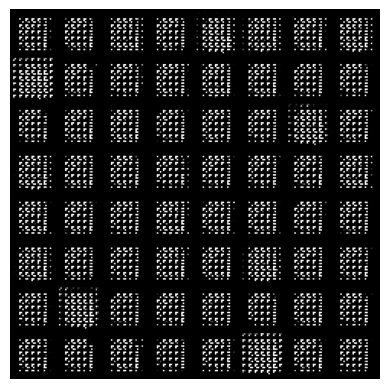

Epoch [15/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.5954
Epoch [15/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0983
Epoch [15/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.6409
Epoch [15/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.8392
Epoch [15/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.2485
Epoch [15/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.9873
Epoch [15/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0681
Epoch [15/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.6532
Epoch [15/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.8177


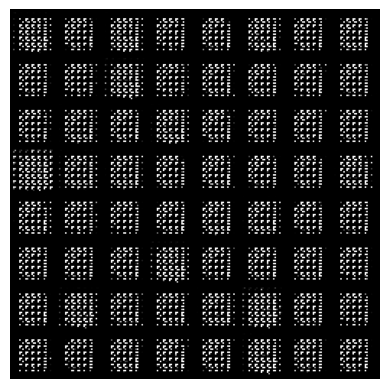

Epoch [16/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.8665
Epoch [16/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.2491
Epoch [16/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.8254
Epoch [16/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.9569
Epoch [16/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.1649
Epoch [16/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0008
Epoch [16/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.2800
Epoch [16/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0883
Epoch [16/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.2256


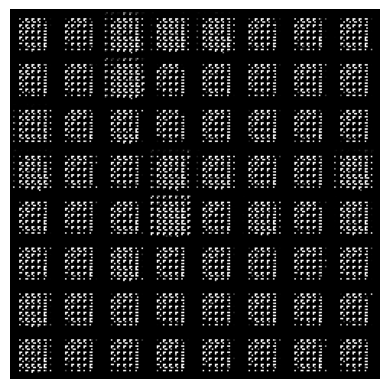

Epoch [17/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.9228
Epoch [17/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.9742
Epoch [17/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 44.0193
Epoch [17/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.5363
Epoch [17/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.8849
Epoch [17/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.9064
Epoch [17/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.9307
Epoch [17/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.1632
Epoch [17/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.9913


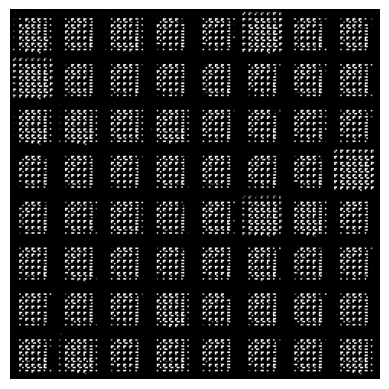

Epoch [18/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.2098
Epoch [18/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.2764
Epoch [18/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.2362
Epoch [18/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.2040
Epoch [18/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.5538
Epoch [18/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.3850
Epoch [18/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.7244
Epoch [18/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.4250
Epoch [18/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.2300


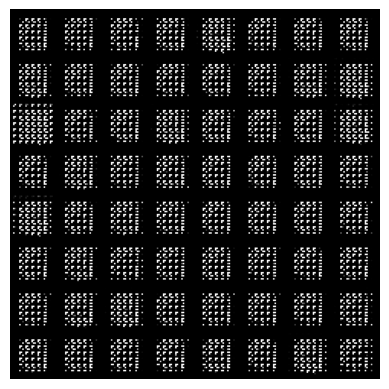

Epoch [19/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.0798
Epoch [19/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.0887
Epoch [19/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.9163
Epoch [19/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.9176
Epoch [19/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.7866
Epoch [19/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.5501
Epoch [19/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 43.0346
Epoch [19/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.6324
Epoch [19/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.5413


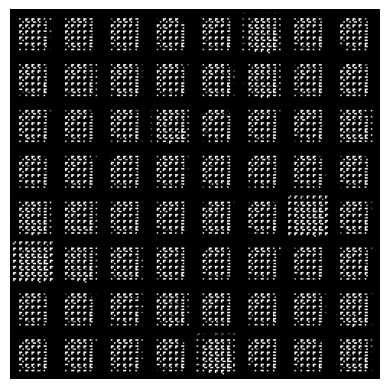

Epoch [20/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.6455
Epoch [20/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.5033
Epoch [20/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.6895
Epoch [20/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.3823
Epoch [20/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.0629
Epoch [20/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.9590
Epoch [20/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.1568
Epoch [20/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 42.0708
Epoch [20/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.6668


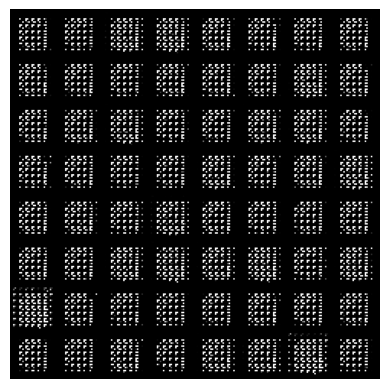

Epoch [21/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.8179
Epoch [21/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.9508
Epoch [21/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.7208
Epoch [21/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.4362
Epoch [21/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 41.4779
Epoch [21/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 24.7871
Epoch [21/100], Batch [700/938], D_real: 0.9963, D_fake: 0.0009, Loss_D: 0.0048, Loss_G: 9.8449
Epoch [21/100], Batch [800/938], D_real: 0.9999, D_fake: 0.0000, Loss_D: 0.0001, Loss_G: 11.1474
Epoch [21/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.5946


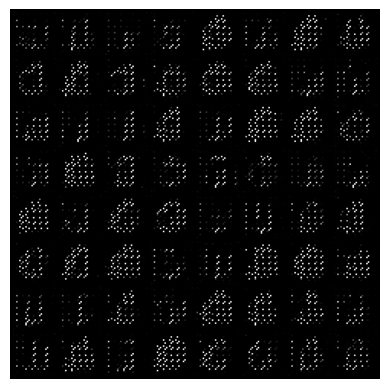

Epoch [22/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.9048
Epoch [22/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.7931
Epoch [22/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.5730
Epoch [22/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.7763
Epoch [22/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.2302
Epoch [22/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.4984
Epoch [22/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.7699
Epoch [22/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.9971
Epoch [22/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.9789


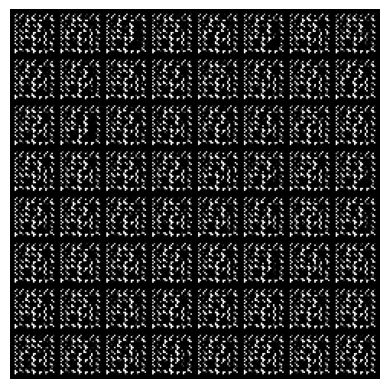

Epoch [23/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.0512
Epoch [23/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.0779
Epoch [23/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0001, Loss_D: 0.0001, Loss_G: 10.2716
Epoch [23/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.6797
Epoch [23/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.6703
Epoch [23/100], Batch [600/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 11.8971
Epoch [23/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.3200
Epoch [23/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 12.2802
Epoch [23/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.3315


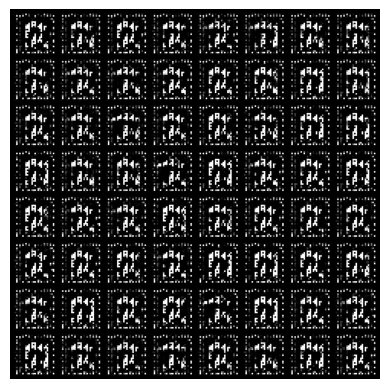

Epoch [24/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.7631
Epoch [24/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.0974
Epoch [24/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.0383
Epoch [24/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.0862
Epoch [24/100], Batch [500/938], D_real: 1.0000, D_fake: 0.0001, Loss_D: 0.0001, Loss_G: 10.2534
Epoch [24/100], Batch [600/938], D_real: 0.9991, D_fake: 0.0001, Loss_D: 0.0010, Loss_G: 14.3717
Epoch [24/100], Batch [700/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.8934
Epoch [24/100], Batch [800/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.6365
Epoch [24/100], Batch [900/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.9202


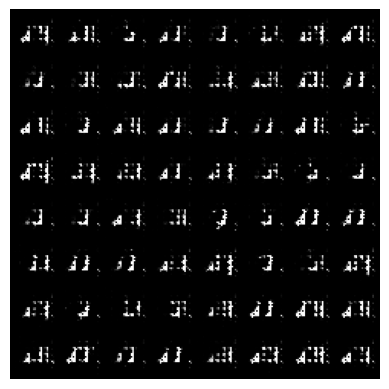

Epoch [25/100], Batch [100/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.7378
Epoch [25/100], Batch [200/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.5408
Epoch [25/100], Batch [300/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 13.8195
Epoch [25/100], Batch [400/938], D_real: 1.0000, D_fake: 0.0000, Loss_D: 0.0000, Loss_G: 14.5674
Epoch [25/100], Batch [500/938], D_real: 0.9998, D_fake: 0.0001, Loss_D: 0.0003, Loss_G: 18.8318
Epoch [25/100], Batch [600/938], D_real: 0.9925, D_fake: 0.0000, Loss_D: 0.0081, Loss_G: 14.2162
Epoch [25/100], Batch [700/938], D_real: 0.9982, D_fake: 0.0023, Loss_D: 0.0042, Loss_G: 8.6609
Epoch [25/100], Batch [800/938], D_real: 0.9995, D_fake: 0.0010, Loss_D: 0.0015, Loss_G: 9.2045
Epoch [25/100], Batch [900/938], D_real: 0.9918, D_fake: 0.0035, Loss_D: 0.0123, Loss_G: 7.5628


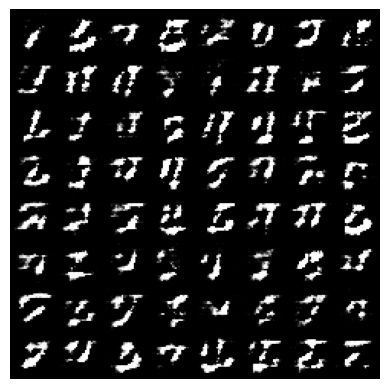

Epoch [26/100], Batch [100/938], D_real: 0.9995, D_fake: 0.0135, Loss_D: 0.0144, Loss_G: 6.0528
Epoch [26/100], Batch [200/938], D_real: 0.9754, D_fake: 0.0076, Loss_D: 0.0363, Loss_G: 7.3726
Epoch [26/100], Batch [300/938], D_real: 0.9865, D_fake: 0.0023, Loss_D: 0.0162, Loss_G: 10.0232
Epoch [26/100], Batch [400/938], D_real: 0.9863, D_fake: 0.0026, Loss_D: 0.0170, Loss_G: 4.9392
Epoch [26/100], Batch [500/938], D_real: 0.9673, D_fake: 0.1382, Loss_D: 0.2172, Loss_G: 3.8171
Epoch [26/100], Batch [600/938], D_real: 0.9005, D_fake: 0.0713, Loss_D: 0.1939, Loss_G: 4.3440
Epoch [26/100], Batch [700/938], D_real: 0.9526, D_fake: 0.0635, Loss_D: 0.1280, Loss_G: 3.4805
Epoch [26/100], Batch [800/938], D_real: 0.9884, D_fake: 0.1342, Loss_D: 0.1866, Loss_G: 3.6157
Epoch [26/100], Batch [900/938], D_real: 0.8663, D_fake: 0.0586, Loss_D: 0.2501, Loss_G: 3.0490


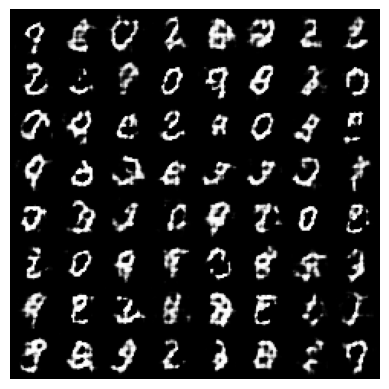

Epoch [27/100], Batch [100/938], D_real: 0.9264, D_fake: 0.1089, Loss_D: 0.2167, Loss_G: 2.6546
Epoch [27/100], Batch [200/938], D_real: 0.9630, D_fake: 0.0505, Loss_D: 0.1009, Loss_G: 4.2070
Epoch [27/100], Batch [300/938], D_real: 0.9685, D_fake: 0.1206, Loss_D: 0.1851, Loss_G: 3.2485
Epoch [27/100], Batch [400/938], D_real: 0.9723, D_fake: 0.0542, Loss_D: 0.0891, Loss_G: 3.7459
Epoch [27/100], Batch [500/938], D_real: 0.9781, D_fake: 0.1354, Loss_D: 0.1983, Loss_G: 2.8089
Epoch [27/100], Batch [600/938], D_real: 0.9662, D_fake: 0.0654, Loss_D: 0.1086, Loss_G: 3.7076
Epoch [27/100], Batch [700/938], D_real: 0.9455, D_fake: 0.1131, Loss_D: 0.2206, Loss_G: 2.8629
Epoch [27/100], Batch [800/938], D_real: 0.9057, D_fake: 0.0280, Loss_D: 0.1522, Loss_G: 5.1612
Epoch [27/100], Batch [900/938], D_real: 0.9668, D_fake: 0.0781, Loss_D: 0.1453, Loss_G: 3.7386


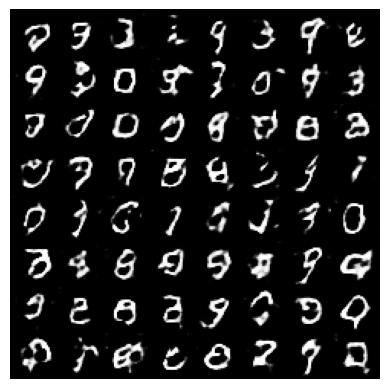

Epoch [28/100], Batch [100/938], D_real: 0.9377, D_fake: 0.0530, Loss_D: 0.1337, Loss_G: 4.1475
Epoch [28/100], Batch [200/938], D_real: 0.9910, D_fake: 0.1502, Loss_D: 0.1975, Loss_G: 1.7084
Epoch [28/100], Batch [300/938], D_real: 0.9191, D_fake: 0.0325, Loss_D: 0.1541, Loss_G: 4.9548
Epoch [28/100], Batch [400/938], D_real: 0.9758, D_fake: 0.0716, Loss_D: 0.1035, Loss_G: 3.1456
Epoch [28/100], Batch [500/938], D_real: 0.9477, D_fake: 0.0246, Loss_D: 0.0862, Loss_G: 4.6913
Epoch [28/100], Batch [600/938], D_real: 0.9468, D_fake: 0.0352, Loss_D: 0.0998, Loss_G: 4.0894
Epoch [28/100], Batch [700/938], D_real: 0.9059, D_fake: 0.0334, Loss_D: 0.1495, Loss_G: 4.2694
Epoch [28/100], Batch [800/938], D_real: 0.9753, D_fake: 0.0952, Loss_D: 0.1534, Loss_G: 4.2972
Epoch [28/100], Batch [900/938], D_real: 0.9579, D_fake: 0.0653, Loss_D: 0.1228, Loss_G: 3.7422


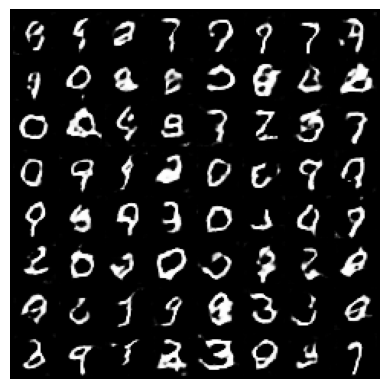

Epoch [29/100], Batch [100/938], D_real: 0.9769, D_fake: 0.0862, Loss_D: 0.1339, Loss_G: 4.3805
Epoch [29/100], Batch [200/938], D_real: 0.9755, D_fake: 0.0610, Loss_D: 0.0968, Loss_G: 2.6885
Epoch [29/100], Batch [300/938], D_real: 0.8199, D_fake: 0.0105, Loss_D: 0.2612, Loss_G: 3.9852
Epoch [29/100], Batch [400/938], D_real: 0.9190, D_fake: 0.0289, Loss_D: 0.1247, Loss_G: 4.0060
Epoch [29/100], Batch [500/938], D_real: 0.9580, D_fake: 0.0181, Loss_D: 0.0650, Loss_G: 4.8339
Epoch [29/100], Batch [600/938], D_real: 0.7828, D_fake: 0.0110, Loss_D: 0.3008, Loss_G: 4.6871
Epoch [29/100], Batch [700/938], D_real: 0.9545, D_fake: 0.0198, Loss_D: 0.0697, Loss_G: 4.7032
Epoch [29/100], Batch [800/938], D_real: 0.8936, D_fake: 0.0609, Loss_D: 0.2094, Loss_G: 3.9413
Epoch [29/100], Batch [900/938], D_real: 0.9420, D_fake: 0.1102, Loss_D: 0.2034, Loss_G: 3.2883


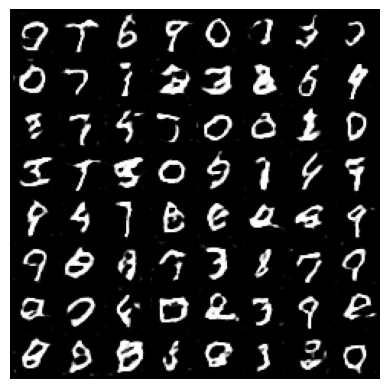

Epoch [30/100], Batch [100/938], D_real: 0.9909, D_fake: 0.0619, Loss_D: 0.0776, Loss_G: 2.8329
Epoch [30/100], Batch [200/938], D_real: 0.9900, D_fake: 0.1521, Loss_D: 0.2335, Loss_G: 3.6142
Epoch [30/100], Batch [300/938], D_real: 0.9964, D_fake: 0.2158, Loss_D: 0.2954, Loss_G: 3.9385
Epoch [30/100], Batch [400/938], D_real: 0.6849, D_fake: 0.0090, Loss_D: 0.4921, Loss_G: 3.9695
Epoch [30/100], Batch [500/938], D_real: 0.9547, D_fake: 0.0610, Loss_D: 0.1176, Loss_G: 3.3151
Epoch [30/100], Batch [600/938], D_real: 0.9241, D_fake: 0.0347, Loss_D: 0.1338, Loss_G: 3.3660
Epoch [30/100], Batch [700/938], D_real: 0.9977, D_fake: 0.2665, Loss_D: 0.4055, Loss_G: 3.3311
Epoch [30/100], Batch [800/938], D_real: 0.9004, D_fake: 0.0265, Loss_D: 0.1539, Loss_G: 3.7233
Epoch [30/100], Batch [900/938], D_real: 0.8909, D_fake: 0.0115, Loss_D: 0.1502, Loss_G: 4.7106


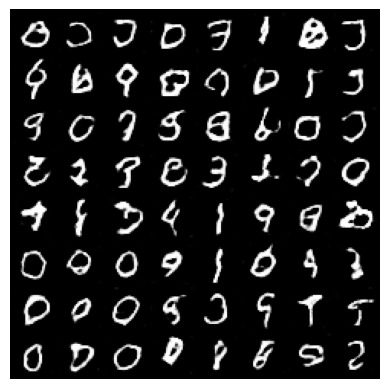

Epoch [31/100], Batch [100/938], D_real: 0.9775, D_fake: 0.0582, Loss_D: 0.0876, Loss_G: 3.5845
Epoch [31/100], Batch [200/938], D_real: 0.9452, D_fake: 0.0279, Loss_D: 0.0914, Loss_G: 3.3581
Epoch [31/100], Batch [300/938], D_real: 0.9593, D_fake: 0.0216, Loss_D: 0.0669, Loss_G: 3.9797
Epoch [31/100], Batch [400/938], D_real: 0.9095, D_fake: 0.0089, Loss_D: 0.1217, Loss_G: 5.5542
Epoch [31/100], Batch [500/938], D_real: 0.9793, D_fake: 0.0720, Loss_D: 0.1023, Loss_G: 3.9110
Epoch [31/100], Batch [600/938], D_real: 0.8912, D_fake: 0.0158, Loss_D: 0.1498, Loss_G: 3.6243
Epoch [31/100], Batch [700/938], D_real: 0.9149, D_fake: 0.0078, Loss_D: 0.1199, Loss_G: 5.2524
Epoch [31/100], Batch [800/938], D_real: 0.9442, D_fake: 0.0349, Loss_D: 0.1006, Loss_G: 4.5204
Epoch [31/100], Batch [900/938], D_real: 0.9240, D_fake: 0.0286, Loss_D: 0.1221, Loss_G: 3.6572


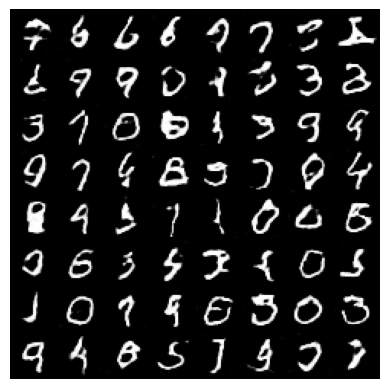

Epoch [32/100], Batch [100/938], D_real: 0.9724, D_fake: 0.0212, Loss_D: 0.0513, Loss_G: 5.7136
Epoch [32/100], Batch [200/938], D_real: 0.9373, D_fake: 0.0276, Loss_D: 0.1119, Loss_G: 4.2116
Epoch [32/100], Batch [300/938], D_real: 0.9736, D_fake: 0.1385, Loss_D: 0.2073, Loss_G: 2.8698
Epoch [32/100], Batch [400/938], D_real: 0.9714, D_fake: 0.0859, Loss_D: 0.1270, Loss_G: 3.0993
Epoch [32/100], Batch [500/938], D_real: 0.9269, D_fake: 0.0404, Loss_D: 0.1312, Loss_G: 3.8843
Epoch [32/100], Batch [600/938], D_real: 0.9894, D_fake: 0.0800, Loss_D: 0.1006, Loss_G: 3.9073
Epoch [32/100], Batch [700/938], D_real: 0.9460, D_fake: 0.0211, Loss_D: 0.0815, Loss_G: 3.5518
Epoch [32/100], Batch [800/938], D_real: 0.8725, D_fake: 0.0190, Loss_D: 0.1720, Loss_G: 3.6476
Epoch [32/100], Batch [900/938], D_real: 0.9685, D_fake: 0.0521, Loss_D: 0.0930, Loss_G: 4.8257


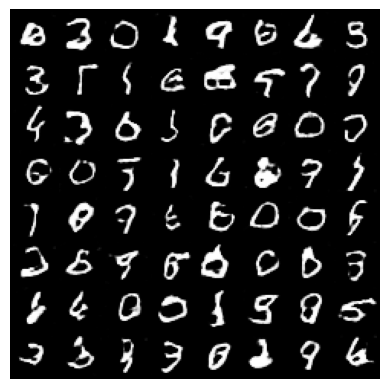

Epoch [33/100], Batch [100/938], D_real: 0.8861, D_fake: 0.0343, Loss_D: 0.1799, Loss_G: 3.2816
Epoch [33/100], Batch [200/938], D_real: 0.8309, D_fake: 0.0266, Loss_D: 0.2533, Loss_G: 4.4261
Epoch [33/100], Batch [300/938], D_real: 0.9650, D_fake: 0.0216, Loss_D: 0.0613, Loss_G: 4.9288
Epoch [33/100], Batch [400/938], D_real: 0.9808, D_fake: 0.1681, Loss_D: 0.2383, Loss_G: 3.2099
Epoch [33/100], Batch [500/938], D_real: 0.9421, D_fake: 0.0381, Loss_D: 0.1046, Loss_G: 3.8143
Epoch [33/100], Batch [600/938], D_real: 0.8438, D_fake: 0.0242, Loss_D: 0.2512, Loss_G: 4.0185
Epoch [33/100], Batch [700/938], D_real: 0.9501, D_fake: 0.1564, Loss_D: 0.2528, Loss_G: 3.5937
Epoch [33/100], Batch [800/938], D_real: 0.9693, D_fake: 0.0477, Loss_D: 0.0861, Loss_G: 3.2332
Epoch [33/100], Batch [900/938], D_real: 0.9922, D_fake: 0.2111, Loss_D: 0.2966, Loss_G: 2.7479


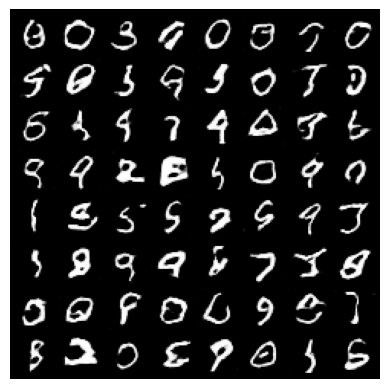

Epoch [34/100], Batch [100/938], D_real: 0.9332, D_fake: 0.0703, Loss_D: 0.1576, Loss_G: 3.5195
Epoch [34/100], Batch [200/938], D_real: 0.8836, D_fake: 0.0115, Loss_D: 0.1538, Loss_G: 5.0327
Epoch [34/100], Batch [300/938], D_real: 0.9564, D_fake: 0.0321, Loss_D: 0.0813, Loss_G: 4.6989
Epoch [34/100], Batch [400/938], D_real: 0.9032, D_fake: 0.0669, Loss_D: 0.1983, Loss_G: 3.8003
Epoch [34/100], Batch [500/938], D_real: 0.9680, D_fake: 0.0883, Loss_D: 0.1413, Loss_G: 2.2570
Epoch [34/100], Batch [600/938], D_real: 0.9824, D_fake: 0.0594, Loss_D: 0.0853, Loss_G: 5.5154
Epoch [34/100], Batch [700/938], D_real: 0.7508, D_fake: 0.0138, Loss_D: 0.3679, Loss_G: 3.9241
Epoch [34/100], Batch [800/938], D_real: 0.8642, D_fake: 0.0143, Loss_D: 0.1972, Loss_G: 4.7231
Epoch [34/100], Batch [900/938], D_real: 0.7066, D_fake: 0.0090, Loss_D: 0.4965, Loss_G: 3.9352


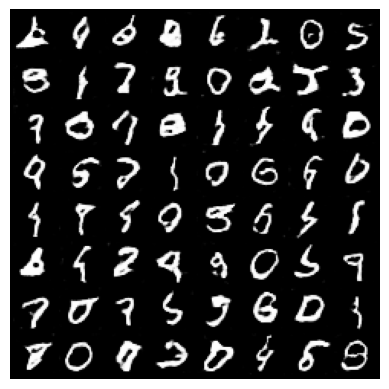

Epoch [35/100], Batch [100/938], D_real: 0.9847, D_fake: 0.1460, Loss_D: 0.2001, Loss_G: 4.1593
Epoch [35/100], Batch [200/938], D_real: 0.9405, D_fake: 0.0297, Loss_D: 0.0976, Loss_G: 4.2043
Epoch [35/100], Batch [300/938], D_real: 0.9269, D_fake: 0.0182, Loss_D: 0.1048, Loss_G: 6.3408
Epoch [35/100], Batch [400/938], D_real: 0.9176, D_fake: 0.0454, Loss_D: 0.1503, Loss_G: 4.6519
Epoch [35/100], Batch [500/938], D_real: 0.9885, D_fake: 0.0544, Loss_D: 0.0710, Loss_G: 3.9504
Epoch [35/100], Batch [600/938], D_real: 0.9817, D_fake: 0.0817, Loss_D: 0.1122, Loss_G: 2.8648
Epoch [35/100], Batch [700/938], D_real: 0.9897, D_fake: 0.1505, Loss_D: 0.1924, Loss_G: 2.6114
Epoch [35/100], Batch [800/938], D_real: 0.8183, D_fake: 0.0249, Loss_D: 0.2894, Loss_G: 3.4245
Epoch [35/100], Batch [900/938], D_real: 0.8600, D_fake: 0.0172, Loss_D: 0.2060, Loss_G: 4.3327


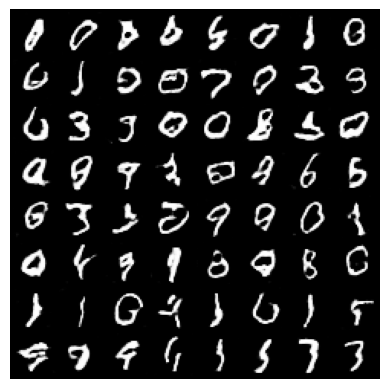

Epoch [36/100], Batch [100/938], D_real: 0.9828, D_fake: 0.0773, Loss_D: 0.1077, Loss_G: 4.4830
Epoch [36/100], Batch [200/938], D_real: 0.9902, D_fake: 0.0266, Loss_D: 0.0380, Loss_G: 3.9830
Epoch [36/100], Batch [300/938], D_real: 0.9266, D_fake: 0.0300, Loss_D: 0.1312, Loss_G: 3.8238
Epoch [36/100], Batch [400/938], D_real: 0.9690, D_fake: 0.0316, Loss_D: 0.0682, Loss_G: 3.4128
Epoch [36/100], Batch [500/938], D_real: 0.9212, D_fake: 0.1163, Loss_D: 0.2340, Loss_G: 2.9658
Epoch [36/100], Batch [600/938], D_real: 0.9958, D_fake: 0.0754, Loss_D: 0.1009, Loss_G: 3.2230
Epoch [36/100], Batch [700/938], D_real: 0.9470, D_fake: 0.0629, Loss_D: 0.1286, Loss_G: 3.6317
Epoch [36/100], Batch [800/938], D_real: 0.9658, D_fake: 0.0960, Loss_D: 0.1536, Loss_G: 4.8700
Epoch [36/100], Batch [900/938], D_real: 0.9703, D_fake: 0.0565, Loss_D: 0.0938, Loss_G: 3.7978


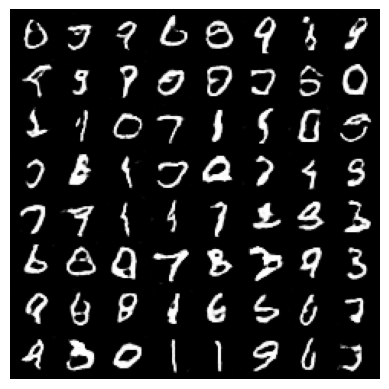

Epoch [37/100], Batch [100/938], D_real: 0.9706, D_fake: 0.1043, Loss_D: 0.1666, Loss_G: 3.7711
Epoch [37/100], Batch [200/938], D_real: 0.9717, D_fake: 0.0536, Loss_D: 0.0959, Loss_G: 3.5080
Epoch [37/100], Batch [300/938], D_real: 0.9755, D_fake: 0.0580, Loss_D: 0.0953, Loss_G: 3.3830
Epoch [37/100], Batch [400/938], D_real: 0.9256, D_fake: 0.0070, Loss_D: 0.1016, Loss_G: 7.3226
Epoch [37/100], Batch [500/938], D_real: 0.9911, D_fake: 0.0871, Loss_D: 0.1162, Loss_G: 3.0839
Epoch [37/100], Batch [600/938], D_real: 0.9899, D_fake: 0.0733, Loss_D: 0.0949, Loss_G: 4.4806
Epoch [37/100], Batch [700/938], D_real: 0.9552, D_fake: 0.0347, Loss_D: 0.0860, Loss_G: 4.0826
Epoch [37/100], Batch [800/938], D_real: 0.9849, D_fake: 0.0704, Loss_D: 0.0978, Loss_G: 4.3374
Epoch [37/100], Batch [900/938], D_real: 0.9906, D_fake: 0.0577, Loss_D: 0.0727, Loss_G: 4.1075


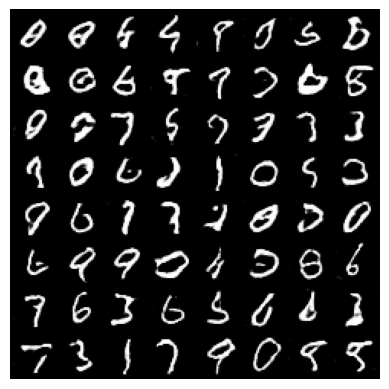

Epoch [38/100], Batch [100/938], D_real: 0.9761, D_fake: 0.0862, Loss_D: 0.1253, Loss_G: 4.4641
Epoch [38/100], Batch [200/938], D_real: 0.9771, D_fake: 0.0988, Loss_D: 0.1482, Loss_G: 3.1273
Epoch [38/100], Batch [300/938], D_real: 0.9235, D_fake: 0.0322, Loss_D: 0.1282, Loss_G: 3.7751
Epoch [38/100], Batch [400/938], D_real: 0.9896, D_fake: 0.0388, Loss_D: 0.0529, Loss_G: 4.3137
Epoch [38/100], Batch [500/938], D_real: 0.9689, D_fake: 0.0364, Loss_D: 0.0762, Loss_G: 4.5907
Epoch [38/100], Batch [600/938], D_real: 0.9444, D_fake: 0.0647, Loss_D: 0.1442, Loss_G: 3.9807
Epoch [38/100], Batch [700/938], D_real: 0.9182, D_fake: 0.0371, Loss_D: 0.1389, Loss_G: 4.4600
Epoch [38/100], Batch [800/938], D_real: 0.9493, D_fake: 0.0361, Loss_D: 0.1006, Loss_G: 4.5321
Epoch [38/100], Batch [900/938], D_real: 0.9939, D_fake: 0.1489, Loss_D: 0.2275, Loss_G: 2.8004


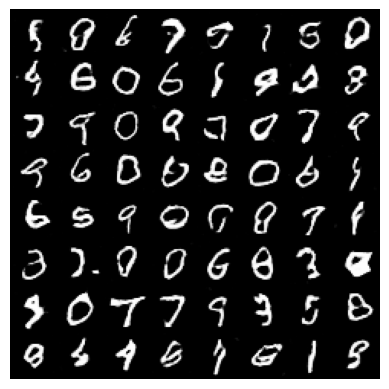

Epoch [39/100], Batch [100/938], D_real: 0.9420, D_fake: 0.0782, Loss_D: 0.1683, Loss_G: 2.9053
Epoch [39/100], Batch [200/938], D_real: 0.9979, D_fake: 0.2357, Loss_D: 0.3630, Loss_G: 2.5707
Epoch [39/100], Batch [300/938], D_real: 0.9365, D_fake: 0.0310, Loss_D: 0.1261, Loss_G: 4.7024
Epoch [39/100], Batch [400/938], D_real: 0.9800, D_fake: 0.0443, Loss_D: 0.0787, Loss_G: 3.9785
Epoch [39/100], Batch [500/938], D_real: 0.9905, D_fake: 0.0418, Loss_D: 0.0553, Loss_G: 5.1918
Epoch [39/100], Batch [600/938], D_real: 0.9630, D_fake: 0.0947, Loss_D: 0.1561, Loss_G: 3.7335
Epoch [39/100], Batch [700/938], D_real: 0.9947, D_fake: 0.2717, Loss_D: 0.4061, Loss_G: 3.3624
Epoch [39/100], Batch [800/938], D_real: 0.9693, D_fake: 0.0233, Loss_D: 0.0600, Loss_G: 5.2528
Epoch [39/100], Batch [900/938], D_real: 0.9326, D_fake: 0.0091, Loss_D: 0.0885, Loss_G: 6.1628


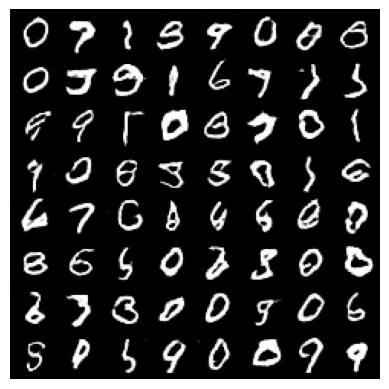

Epoch [40/100], Batch [100/938], D_real: 0.9401, D_fake: 0.0184, Loss_D: 0.0868, Loss_G: 4.8925
Epoch [40/100], Batch [200/938], D_real: 0.9851, D_fake: 0.0363, Loss_D: 0.0561, Loss_G: 3.4148
Epoch [40/100], Batch [300/938], D_real: 0.9663, D_fake: 0.0297, Loss_D: 0.0717, Loss_G: 5.1857
Epoch [40/100], Batch [400/938], D_real: 0.8225, D_fake: 0.0076, Loss_D: 0.2507, Loss_G: 5.1040
Epoch [40/100], Batch [500/938], D_real: 0.9358, D_fake: 0.0780, Loss_D: 0.1649, Loss_G: 3.6313
Epoch [40/100], Batch [600/938], D_real: 0.9904, D_fake: 0.1765, Loss_D: 0.2417, Loss_G: 3.8995
Epoch [40/100], Batch [700/938], D_real: 0.9917, D_fake: 0.0558, Loss_D: 0.0725, Loss_G: 5.2088
Epoch [40/100], Batch [800/938], D_real: 0.9654, D_fake: 0.0341, Loss_D: 0.0802, Loss_G: 4.6584
Epoch [40/100], Batch [900/938], D_real: 0.8643, D_fake: 0.0095, Loss_D: 0.1854, Loss_G: 5.6552


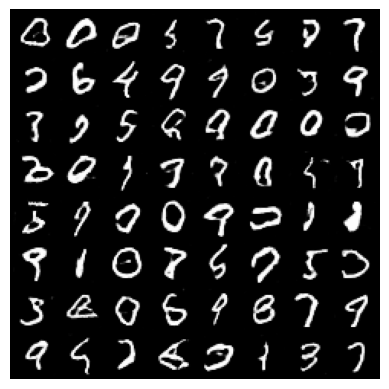

Epoch [41/100], Batch [100/938], D_real: 0.9896, D_fake: 0.1826, Loss_D: 0.2698, Loss_G: 2.9288
Epoch [41/100], Batch [200/938], D_real: 0.9784, D_fake: 0.0399, Loss_D: 0.0656, Loss_G: 4.4514
Epoch [41/100], Batch [300/938], D_real: 0.8755, D_fake: 0.0400, Loss_D: 0.2152, Loss_G: 4.3570
Epoch [41/100], Batch [400/938], D_real: 0.7931, D_fake: 0.0038, Loss_D: 0.3088, Loss_G: 4.9790
Epoch [41/100], Batch [500/938], D_real: 0.9692, D_fake: 0.0211, Loss_D: 0.0588, Loss_G: 5.0545
Epoch [41/100], Batch [600/938], D_real: 0.9907, D_fake: 0.0843, Loss_D: 0.1228, Loss_G: 3.3812
Epoch [41/100], Batch [700/938], D_real: 0.9441, D_fake: 0.0417, Loss_D: 0.1111, Loss_G: 4.0690
Epoch [41/100], Batch [800/938], D_real: 0.9900, D_fake: 0.0244, Loss_D: 0.0373, Loss_G: 4.9938
Epoch [41/100], Batch [900/938], D_real: 0.8453, D_fake: 0.0217, Loss_D: 0.2547, Loss_G: 4.5110


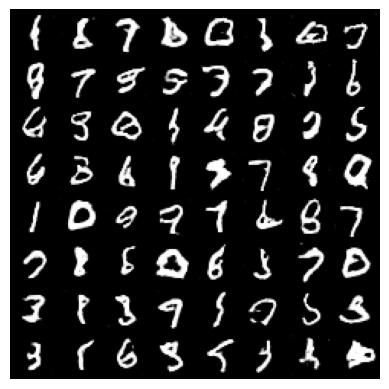

Epoch [42/100], Batch [100/938], D_real: 0.9699, D_fake: 0.0358, Loss_D: 0.0690, Loss_G: 4.1523
Epoch [42/100], Batch [200/938], D_real: 0.7887, D_fake: 0.0068, Loss_D: 0.3686, Loss_G: 5.0746
Epoch [42/100], Batch [300/938], D_real: 0.8666, D_fake: 0.0408, Loss_D: 0.2288, Loss_G: 3.8774
Epoch [42/100], Batch [400/938], D_real: 0.8305, D_fake: 0.0076, Loss_D: 0.2421, Loss_G: 5.4305
Epoch [42/100], Batch [500/938], D_real: 0.9911, D_fake: 0.0901, Loss_D: 0.1109, Loss_G: 3.6348
Epoch [42/100], Batch [600/938], D_real: 0.9922, D_fake: 0.2127, Loss_D: 0.3339, Loss_G: 3.2719
Epoch [42/100], Batch [700/938], D_real: 0.9878, D_fake: 0.2379, Loss_D: 0.3663, Loss_G: 4.1534
Epoch [42/100], Batch [800/938], D_real: 0.9880, D_fake: 0.0554, Loss_D: 0.0792, Loss_G: 4.0130
Epoch [42/100], Batch [900/938], D_real: 0.9044, D_fake: 0.0152, Loss_D: 0.1416, Loss_G: 4.5460


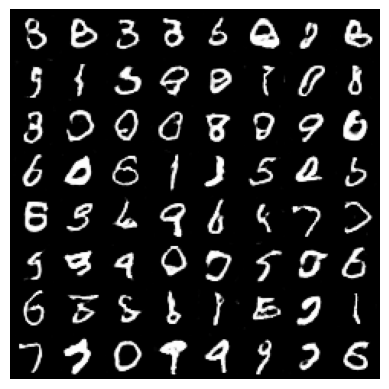

Epoch [43/100], Batch [100/938], D_real: 0.9779, D_fake: 0.0351, Loss_D: 0.0602, Loss_G: 4.8069
Epoch [43/100], Batch [200/938], D_real: 0.9770, D_fake: 0.0268, Loss_D: 0.0535, Loss_G: 3.7851
Epoch [43/100], Batch [300/938], D_real: 0.9461, D_fake: 0.0219, Loss_D: 0.1078, Loss_G: 4.3277
Epoch [43/100], Batch [400/938], D_real: 0.9212, D_fake: 0.0184, Loss_D: 0.1137, Loss_G: 4.2104
Epoch [43/100], Batch [500/938], D_real: 0.9946, D_fake: 0.0975, Loss_D: 0.1345, Loss_G: 3.7844
Epoch [43/100], Batch [600/938], D_real: 0.9747, D_fake: 0.0671, Loss_D: 0.1017, Loss_G: 3.5574
Epoch [43/100], Batch [700/938], D_real: 0.9169, D_fake: 0.0216, Loss_D: 0.1208, Loss_G: 4.9452
Epoch [43/100], Batch [800/938], D_real: 0.8515, D_fake: 0.0146, Loss_D: 0.1948, Loss_G: 4.1557
Epoch [43/100], Batch [900/938], D_real: 0.9762, D_fake: 0.0139, Loss_D: 0.0396, Loss_G: 5.4682


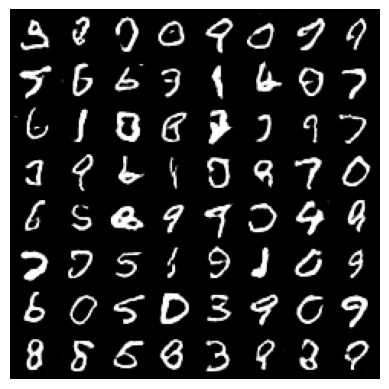

Epoch [44/100], Batch [100/938], D_real: 0.9883, D_fake: 0.3668, Loss_D: 0.6661, Loss_G: 4.0163
Epoch [44/100], Batch [200/938], D_real: 0.9702, D_fake: 0.0194, Loss_D: 0.0527, Loss_G: 5.7803
Epoch [44/100], Batch [300/938], D_real: 0.9137, D_fake: 0.0045, Loss_D: 0.1204, Loss_G: 6.8112
Epoch [44/100], Batch [400/938], D_real: 0.9863, D_fake: 0.0864, Loss_D: 0.1260, Loss_G: 4.3074
Epoch [44/100], Batch [500/938], D_real: 0.9552, D_fake: 0.0470, Loss_D: 0.1029, Loss_G: 4.1931
Epoch [44/100], Batch [600/938], D_real: 0.9328, D_fake: 0.0191, Loss_D: 0.0983, Loss_G: 5.2226
Epoch [44/100], Batch [700/938], D_real: 0.9641, D_fake: 0.0684, Loss_D: 0.1256, Loss_G: 4.2992
Epoch [44/100], Batch [800/938], D_real: 0.9871, D_fake: 0.0592, Loss_D: 0.0876, Loss_G: 4.1769
Epoch [44/100], Batch [900/938], D_real: 0.9892, D_fake: 0.0442, Loss_D: 0.0602, Loss_G: 3.9280


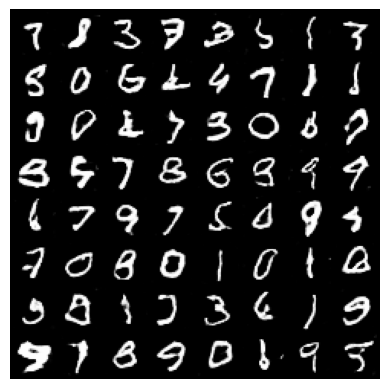

Epoch [45/100], Batch [100/938], D_real: 0.9887, D_fake: 0.0741, Loss_D: 0.0975, Loss_G: 4.7185
Epoch [45/100], Batch [200/938], D_real: 0.9639, D_fake: 0.1187, Loss_D: 0.1849, Loss_G: 4.2248
Epoch [45/100], Batch [300/938], D_real: 0.9810, D_fake: 0.0358, Loss_D: 0.0570, Loss_G: 4.5321
Epoch [45/100], Batch [400/938], D_real: 0.7391, D_fake: 0.0071, Loss_D: 0.4195, Loss_G: 4.3246
Epoch [45/100], Batch [500/938], D_real: 0.9895, D_fake: 0.0682, Loss_D: 0.0872, Loss_G: 3.7895
Epoch [45/100], Batch [600/938], D_real: 0.9620, D_fake: 0.0468, Loss_D: 0.0952, Loss_G: 4.0187
Epoch [45/100], Batch [700/938], D_real: 0.9512, D_fake: 0.0129, Loss_D: 0.0666, Loss_G: 4.1385
Epoch [45/100], Batch [800/938], D_real: 0.9865, D_fake: 0.1356, Loss_D: 0.2106, Loss_G: 5.2591
Epoch [45/100], Batch [900/938], D_real: 0.9813, D_fake: 0.0689, Loss_D: 0.1087, Loss_G: 4.4086


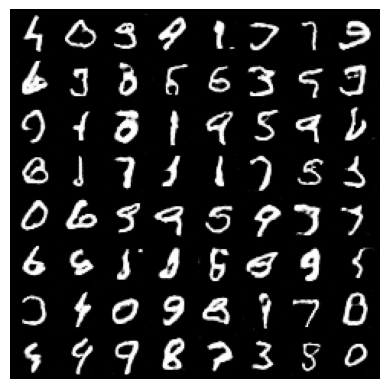

Epoch [46/100], Batch [100/938], D_real: 0.9930, D_fake: 0.1767, Loss_D: 0.2511, Loss_G: 2.9625
Epoch [46/100], Batch [200/938], D_real: 0.9369, D_fake: 0.1012, Loss_D: 0.1950, Loss_G: 4.1154
Epoch [46/100], Batch [300/938], D_real: 0.9698, D_fake: 0.0219, Loss_D: 0.0668, Loss_G: 4.3494
Epoch [46/100], Batch [400/938], D_real: 0.9951, D_fake: 0.2639, Loss_D: 0.4104, Loss_G: 3.0586
Epoch [46/100], Batch [500/938], D_real: 0.9895, D_fake: 0.0480, Loss_D: 0.0725, Loss_G: 2.8599
Epoch [46/100], Batch [600/938], D_real: 0.9118, D_fake: 0.0241, Loss_D: 0.1313, Loss_G: 4.8987
Epoch [46/100], Batch [700/938], D_real: 0.8398, D_fake: 0.0338, Loss_D: 0.2835, Loss_G: 4.9342
Epoch [46/100], Batch [800/938], D_real: 0.9978, D_fake: 0.2554, Loss_D: 0.4140, Loss_G: 3.1992
Epoch [46/100], Batch [900/938], D_real: 0.9437, D_fake: 0.0386, Loss_D: 0.1103, Loss_G: 4.6386


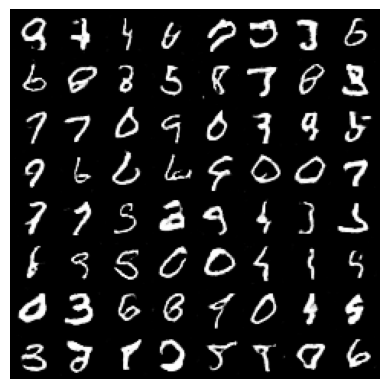

Epoch [47/100], Batch [100/938], D_real: 0.9451, D_fake: 0.0504, Loss_D: 0.1222, Loss_G: 4.3733
Epoch [47/100], Batch [200/938], D_real: 0.9464, D_fake: 0.0153, Loss_D: 0.0736, Loss_G: 5.2970
Epoch [47/100], Batch [300/938], D_real: 0.9647, D_fake: 0.0128, Loss_D: 0.0525, Loss_G: 5.0776
Epoch [47/100], Batch [400/938], D_real: 0.9634, D_fake: 0.0248, Loss_D: 0.0705, Loss_G: 5.4960
Epoch [47/100], Batch [500/938], D_real: 0.9733, D_fake: 0.0162, Loss_D: 0.0449, Loss_G: 5.8334
Epoch [47/100], Batch [600/938], D_real: 0.9680, D_fake: 0.0124, Loss_D: 0.0468, Loss_G: 4.7949
Epoch [47/100], Batch [700/938], D_real: 0.8389, D_fake: 0.0137, Loss_D: 0.2400, Loss_G: 6.5217
Epoch [47/100], Batch [800/938], D_real: 0.9143, D_fake: 0.0464, Loss_D: 0.1606, Loss_G: 4.6063
Epoch [47/100], Batch [900/938], D_real: 0.8756, D_fake: 0.0107, Loss_D: 0.1891, Loss_G: 4.2375


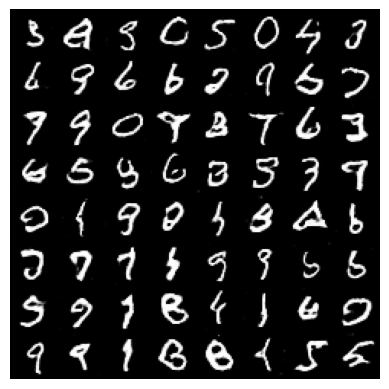

Epoch [48/100], Batch [100/938], D_real: 0.9954, D_fake: 0.1791, Loss_D: 0.2552, Loss_G: 3.4652
Epoch [48/100], Batch [200/938], D_real: 0.8371, D_fake: 0.0161, Loss_D: 0.2457, Loss_G: 4.8165
Epoch [48/100], Batch [300/938], D_real: 0.9939, D_fake: 0.0684, Loss_D: 0.0842, Loss_G: 3.8514
Epoch [48/100], Batch [400/938], D_real: 0.9824, D_fake: 0.0515, Loss_D: 0.0826, Loss_G: 3.8915
Epoch [48/100], Batch [500/938], D_real: 0.9835, D_fake: 0.0294, Loss_D: 0.0489, Loss_G: 3.8957
Epoch [48/100], Batch [600/938], D_real: 0.9612, D_fake: 0.0158, Loss_D: 0.0595, Loss_G: 3.8597
Epoch [48/100], Batch [700/938], D_real: 0.9353, D_fake: 0.0136, Loss_D: 0.0912, Loss_G: 6.5190
Epoch [48/100], Batch [800/938], D_real: 0.9278, D_fake: 0.0196, Loss_D: 0.1158, Loss_G: 4.4917
Epoch [48/100], Batch [900/938], D_real: 0.9175, D_fake: 0.0104, Loss_D: 0.1132, Loss_G: 4.8554


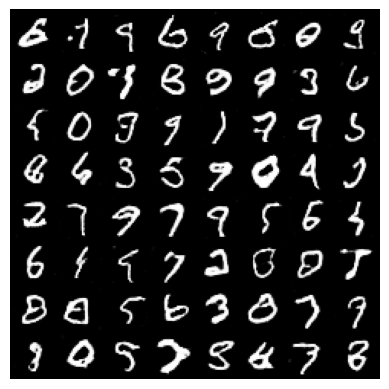

Epoch [49/100], Batch [100/938], D_real: 0.8763, D_fake: 0.0310, Loss_D: 0.2129, Loss_G: 3.8908
Epoch [49/100], Batch [200/938], D_real: 0.9781, D_fake: 0.0796, Loss_D: 0.1209, Loss_G: 4.2487
Epoch [49/100], Batch [300/938], D_real: 0.9164, D_fake: 0.0074, Loss_D: 0.1076, Loss_G: 6.5987
Epoch [49/100], Batch [400/938], D_real: 0.9604, D_fake: 0.1185, Loss_D: 0.2042, Loss_G: 4.3908
Epoch [49/100], Batch [500/938], D_real: 0.9643, D_fake: 0.0564, Loss_D: 0.1067, Loss_G: 5.0111
Epoch [49/100], Batch [600/938], D_real: 0.9899, D_fake: 0.0855, Loss_D: 0.1144, Loss_G: 4.2741
Epoch [49/100], Batch [700/938], D_real: 0.9365, D_fake: 0.0459, Loss_D: 0.1491, Loss_G: 3.7020
Epoch [49/100], Batch [800/938], D_real: 0.9747, D_fake: 0.0421, Loss_D: 0.0734, Loss_G: 4.6846
Epoch [49/100], Batch [900/938], D_real: 0.9799, D_fake: 0.0724, Loss_D: 0.1036, Loss_G: 3.7114


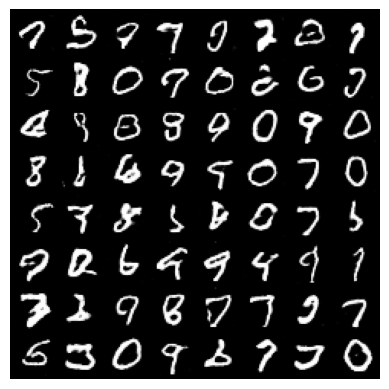

Epoch [50/100], Batch [100/938], D_real: 0.9937, D_fake: 0.3511, Loss_D: 0.5868, Loss_G: 4.5137
Epoch [50/100], Batch [200/938], D_real: 0.9691, D_fake: 0.0608, Loss_D: 0.1109, Loss_G: 3.6245
Epoch [50/100], Batch [300/938], D_real: 0.9608, D_fake: 0.0433, Loss_D: 0.0903, Loss_G: 4.4295
Epoch [50/100], Batch [400/938], D_real: 0.8900, D_fake: 0.0112, Loss_D: 0.1474, Loss_G: 4.7117
Epoch [50/100], Batch [500/938], D_real: 0.9093, D_fake: 0.0331, Loss_D: 0.1494, Loss_G: 3.3724
Epoch [50/100], Batch [600/938], D_real: 0.9430, D_fake: 0.0391, Loss_D: 0.1059, Loss_G: 4.1246
Epoch [50/100], Batch [700/938], D_real: 0.9866, D_fake: 0.1297, Loss_D: 0.1854, Loss_G: 3.4625
Epoch [50/100], Batch [800/938], D_real: 0.9265, D_fake: 0.0327, Loss_D: 0.1230, Loss_G: 4.8172
Epoch [50/100], Batch [900/938], D_real: 0.9517, D_fake: 0.0288, Loss_D: 0.0945, Loss_G: 9.3976


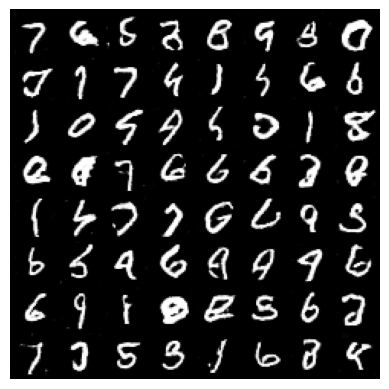

Epoch [51/100], Batch [100/938], D_real: 0.9965, D_fake: 0.3666, Loss_D: 0.6279, Loss_G: 3.1332
Epoch [51/100], Batch [200/938], D_real: 0.9336, D_fake: 0.0290, Loss_D: 0.1065, Loss_G: 5.1122
Epoch [51/100], Batch [300/938], D_real: 0.9910, D_fake: 0.0250, Loss_D: 0.0356, Loss_G: 4.7976
Epoch [51/100], Batch [400/938], D_real: 0.9437, D_fake: 0.0492, Loss_D: 0.1225, Loss_G: 4.3139
Epoch [51/100], Batch [500/938], D_real: 0.8897, D_fake: 0.0052, Loss_D: 0.1437, Loss_G: 9.2576
Epoch [51/100], Batch [600/938], D_real: 0.9313, D_fake: 0.0119, Loss_D: 0.0947, Loss_G: 3.9292
Epoch [51/100], Batch [700/938], D_real: 0.8678, D_fake: 0.0125, Loss_D: 0.1860, Loss_G: 5.5478
Epoch [51/100], Batch [800/938], D_real: 0.9690, D_fake: 0.0301, Loss_D: 0.0657, Loss_G: 4.8210
Epoch [51/100], Batch [900/938], D_real: 0.9151, D_fake: 0.0077, Loss_D: 0.1058, Loss_G: 6.5435


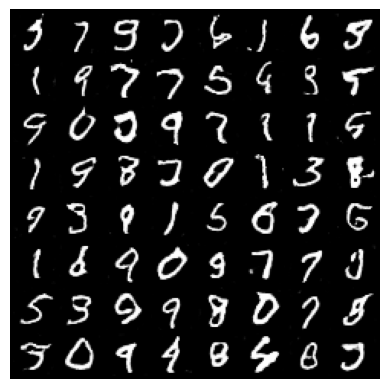

Epoch [52/100], Batch [100/938], D_real: 0.9856, D_fake: 0.1339, Loss_D: 0.2061, Loss_G: 4.4497
Epoch [52/100], Batch [200/938], D_real: 0.9212, D_fake: 0.0113, Loss_D: 0.1028, Loss_G: 6.0285
Epoch [52/100], Batch [300/938], D_real: 0.9955, D_fake: 0.0661, Loss_D: 0.0861, Loss_G: 4.6356
Epoch [52/100], Batch [400/938], D_real: 0.9808, D_fake: 0.0824, Loss_D: 0.1193, Loss_G: 4.2854
Epoch [52/100], Batch [500/938], D_real: 0.9984, D_fake: 0.1589, Loss_D: 0.2299, Loss_G: 3.0963
Epoch [52/100], Batch [600/938], D_real: 0.9170, D_fake: 0.0344, Loss_D: 0.1336, Loss_G: 3.8912
Epoch [52/100], Batch [700/938], D_real: 0.9581, D_fake: 0.0182, Loss_D: 0.0671, Loss_G: 5.0827
Epoch [52/100], Batch [800/938], D_real: 0.9225, D_fake: 0.0286, Loss_D: 0.1311, Loss_G: 4.0677
Epoch [52/100], Batch [900/938], D_real: 0.8942, D_fake: 0.0289, Loss_D: 0.1805, Loss_G: 6.1649


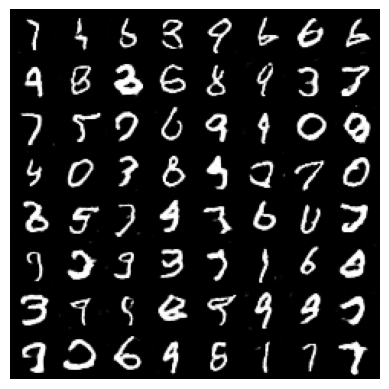

Epoch [53/100], Batch [100/938], D_real: 0.9055, D_fake: 0.0339, Loss_D: 0.1629, Loss_G: 4.6598
Epoch [53/100], Batch [200/938], D_real: 0.9896, D_fake: 0.1500, Loss_D: 0.2197, Loss_G: 2.5665
Epoch [53/100], Batch [300/938], D_real: 0.9982, D_fake: 0.1814, Loss_D: 0.2327, Loss_G: 3.3663
Epoch [53/100], Batch [400/938], D_real: 0.8978, D_fake: 0.0088, Loss_D: 0.1574, Loss_G: 7.2629
Epoch [53/100], Batch [500/938], D_real: 0.9763, D_fake: 0.0312, Loss_D: 0.0582, Loss_G: 5.1475
Epoch [53/100], Batch [600/938], D_real: 0.9672, D_fake: 0.0215, Loss_D: 0.0594, Loss_G: 5.7088
Epoch [53/100], Batch [700/938], D_real: 0.9942, D_fake: 0.0381, Loss_D: 0.0490, Loss_G: 4.1218
Epoch [53/100], Batch [800/938], D_real: 0.9871, D_fake: 0.0067, Loss_D: 0.0204, Loss_G: 6.0505
Epoch [53/100], Batch [900/938], D_real: 0.9913, D_fake: 0.0701, Loss_D: 0.1061, Loss_G: 3.4953


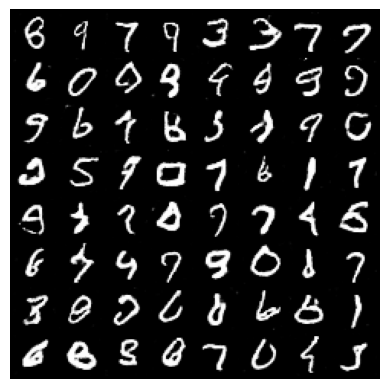

Epoch [54/100], Batch [100/938], D_real: 0.9830, D_fake: 0.1051, Loss_D: 0.1630, Loss_G: 3.5261
Epoch [54/100], Batch [200/938], D_real: 0.9868, D_fake: 0.1056, Loss_D: 0.1611, Loss_G: 3.4055
Epoch [54/100], Batch [300/938], D_real: 0.9870, D_fake: 0.0881, Loss_D: 0.1263, Loss_G: 4.4794
Epoch [54/100], Batch [400/938], D_real: 0.8612, D_fake: 0.0030, Loss_D: 0.2177, Loss_G: 7.3654
Epoch [54/100], Batch [500/938], D_real: 0.9453, D_fake: 0.0205, Loss_D: 0.0851, Loss_G: 4.9498
Epoch [54/100], Batch [600/938], D_real: 0.8636, D_fake: 0.0049, Loss_D: 0.1913, Loss_G: 6.8741
Epoch [54/100], Batch [700/938], D_real: 0.9625, D_fake: 0.0244, Loss_D: 0.0682, Loss_G: 7.1708
Epoch [54/100], Batch [800/938], D_real: 0.8978, D_fake: 0.0374, Loss_D: 0.1896, Loss_G: 5.4832
Epoch [54/100], Batch [900/938], D_real: 0.9918, D_fake: 0.0880, Loss_D: 0.1178, Loss_G: 2.8294


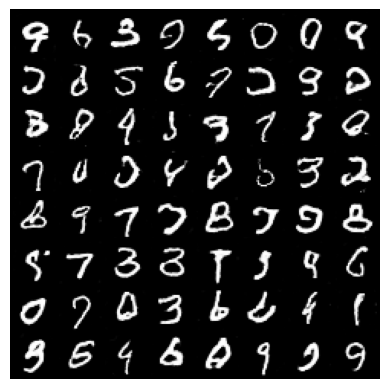

Epoch [55/100], Batch [100/938], D_real: 0.9869, D_fake: 0.1014, Loss_D: 0.1357, Loss_G: 3.7758
Epoch [55/100], Batch [200/938], D_real: 0.9956, D_fake: 0.0943, Loss_D: 0.1170, Loss_G: 4.5801
Epoch [55/100], Batch [300/938], D_real: 0.9937, D_fake: 0.0972, Loss_D: 0.1300, Loss_G: 2.1126
Epoch [55/100], Batch [400/938], D_real: 0.8749, D_fake: 0.0079, Loss_D: 0.1836, Loss_G: 5.4139
Epoch [55/100], Batch [500/938], D_real: 0.6441, D_fake: 0.0028, Loss_D: 0.7125, Loss_G: 7.0044
Epoch [55/100], Batch [600/938], D_real: 0.8853, D_fake: 0.0274, Loss_D: 0.1700, Loss_G: 4.2885
Epoch [55/100], Batch [700/938], D_real: 0.8584, D_fake: 0.0165, Loss_D: 0.2215, Loss_G: 5.0621
Epoch [55/100], Batch [800/938], D_real: 0.9220, D_fake: 0.0146, Loss_D: 0.1042, Loss_G: 5.4998
Epoch [55/100], Batch [900/938], D_real: 0.9497, D_fake: 0.1189, Loss_D: 0.2278, Loss_G: 2.1013


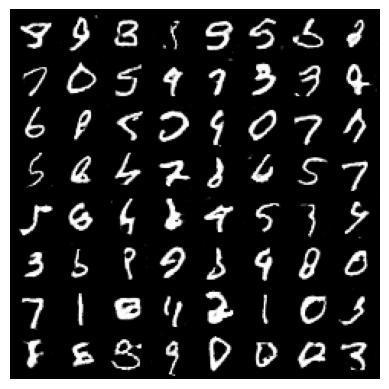

Epoch [56/100], Batch [100/938], D_real: 0.6736, D_fake: 0.0087, Loss_D: 0.5824, Loss_G: 4.3237
Epoch [56/100], Batch [200/938], D_real: 0.9497, D_fake: 0.0282, Loss_D: 0.0964, Loss_G: 4.3909
Epoch [56/100], Batch [300/938], D_real: 0.9768, D_fake: 0.0089, Loss_D: 0.0344, Loss_G: 7.0587
Epoch [56/100], Batch [400/938], D_real: 0.9881, D_fake: 0.1061, Loss_D: 0.1700, Loss_G: 2.8324
Epoch [56/100], Batch [500/938], D_real: 0.8405, D_fake: 0.0179, Loss_D: 0.2516, Loss_G: 4.4643
Epoch [56/100], Batch [600/938], D_real: 0.8623, D_fake: 0.0313, Loss_D: 0.2109, Loss_G: 3.8605
Epoch [56/100], Batch [700/938], D_real: 0.9528, D_fake: 0.0426, Loss_D: 0.1048, Loss_G: 3.8765
Epoch [56/100], Batch [800/938], D_real: 0.9642, D_fake: 0.0523, Loss_D: 0.0995, Loss_G: 6.5823
Epoch [56/100], Batch [900/938], D_real: 0.9626, D_fake: 0.0279, Loss_D: 0.0757, Loss_G: 5.8787


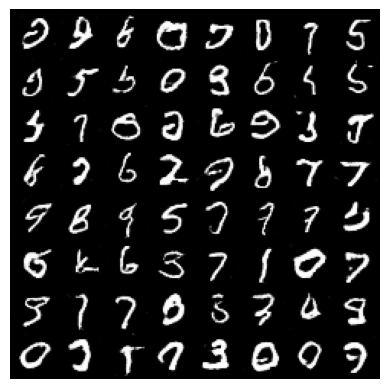

Epoch [57/100], Batch [100/938], D_real: 0.9983, D_fake: 0.2947, Loss_D: 0.5163, Loss_G: 3.8865
Epoch [57/100], Batch [200/938], D_real: 0.8996, D_fake: 0.0482, Loss_D: 0.1984, Loss_G: 4.2866
Epoch [57/100], Batch [300/938], D_real: 0.9963, D_fake: 0.0624, Loss_D: 0.0782, Loss_G: 4.3494
Epoch [57/100], Batch [400/938], D_real: 0.9723, D_fake: 0.1497, Loss_D: 0.2282, Loss_G: 3.7731
Epoch [57/100], Batch [500/938], D_real: 0.9982, D_fake: 0.3968, Loss_D: 0.9631, Loss_G: 3.3677
Epoch [57/100], Batch [600/938], D_real: 0.9493, D_fake: 0.0264, Loss_D: 0.0841, Loss_G: 4.4910
Epoch [57/100], Batch [700/938], D_real: 0.8968, D_fake: 0.0132, Loss_D: 0.1470, Loss_G: 5.4033
Epoch [57/100], Batch [800/938], D_real: 0.9208, D_fake: 0.0321, Loss_D: 0.1345, Loss_G: 4.5850
Epoch [57/100], Batch [900/938], D_real: 0.9694, D_fake: 0.0128, Loss_D: 0.0507, Loss_G: 6.2145


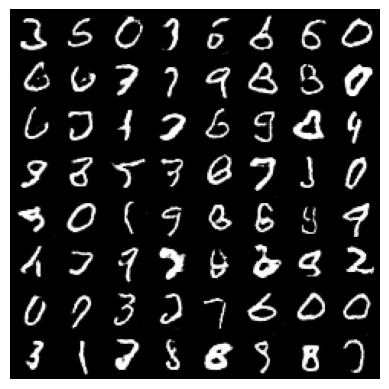

Epoch [58/100], Batch [100/938], D_real: 0.9663, D_fake: 0.0296, Loss_D: 0.0680, Loss_G: 4.1172
Epoch [58/100], Batch [200/938], D_real: 0.9967, D_fake: 0.1048, Loss_D: 0.1402, Loss_G: 3.4593
Epoch [58/100], Batch [300/938], D_real: 0.9942, D_fake: 0.0095, Loss_D: 0.0157, Loss_G: 4.8883
Epoch [58/100], Batch [400/938], D_real: 0.9759, D_fake: 0.0596, Loss_D: 0.1132, Loss_G: 5.9191
Epoch [58/100], Batch [500/938], D_real: 0.9940, D_fake: 0.0936, Loss_D: 0.1178, Loss_G: 4.1175
Epoch [58/100], Batch [600/938], D_real: 0.9490, D_fake: 0.0316, Loss_D: 0.0975, Loss_G: 5.5259
Epoch [58/100], Batch [700/938], D_real: 0.9654, D_fake: 0.0150, Loss_D: 0.0532, Loss_G: 5.3873
Epoch [58/100], Batch [800/938], D_real: 0.9589, D_fake: 0.0546, Loss_D: 0.1097, Loss_G: 5.1368
Epoch [58/100], Batch [900/938], D_real: 0.9871, D_fake: 0.1035, Loss_D: 0.1348, Loss_G: 5.5140


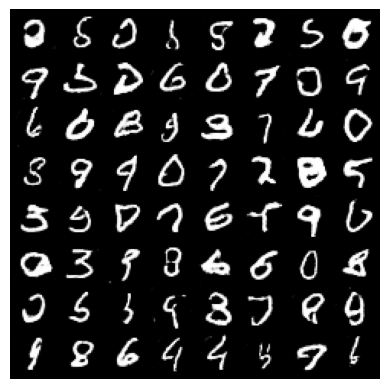

Epoch [59/100], Batch [100/938], D_real: 0.9754, D_fake: 0.1338, Loss_D: 0.2067, Loss_G: 4.6695
Epoch [59/100], Batch [200/938], D_real: 0.5617, D_fake: 0.0041, Loss_D: 0.8848, Loss_G: 6.0755
Epoch [59/100], Batch [300/938], D_real: 0.9755, D_fake: 0.0307, Loss_D: 0.0579, Loss_G: 4.4222
Epoch [59/100], Batch [400/938], D_real: 0.9603, D_fake: 0.0547, Loss_D: 0.1108, Loss_G: 3.4769
Epoch [59/100], Batch [500/938], D_real: 0.9336, D_fake: 0.0463, Loss_D: 0.1311, Loss_G: 4.5199
Epoch [59/100], Batch [600/938], D_real: 0.9603, D_fake: 0.0954, Loss_D: 0.1624, Loss_G: 2.8889
Epoch [59/100], Batch [700/938], D_real: 0.9677, D_fake: 0.0265, Loss_D: 0.0627, Loss_G: 3.8754
Epoch [59/100], Batch [800/938], D_real: 0.9978, D_fake: 0.3080, Loss_D: 0.5666, Loss_G: 3.3203
Epoch [59/100], Batch [900/938], D_real: 0.9764, D_fake: 0.1017, Loss_D: 0.1799, Loss_G: 4.1950


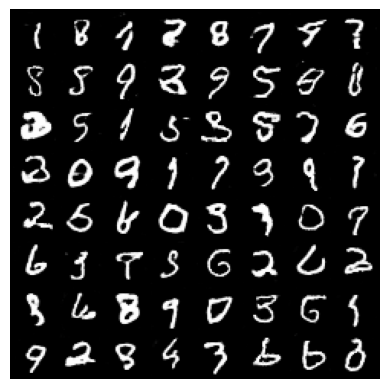

Epoch [60/100], Batch [100/938], D_real: 0.9313, D_fake: 0.0210, Loss_D: 0.1002, Loss_G: 5.2575
Epoch [60/100], Batch [200/938], D_real: 0.8445, D_fake: 0.0115, Loss_D: 0.2528, Loss_G: 5.0811
Epoch [60/100], Batch [300/938], D_real: 0.9976, D_fake: 0.1754, Loss_D: 0.2519, Loss_G: 3.7565
Epoch [60/100], Batch [400/938], D_real: 0.9928, D_fake: 0.1477, Loss_D: 0.2131, Loss_G: 3.3081
Epoch [60/100], Batch [500/938], D_real: 0.9950, D_fake: 0.0512, Loss_D: 0.0861, Loss_G: 4.6310
Epoch [60/100], Batch [600/938], D_real: 0.9680, D_fake: 0.0300, Loss_D: 0.0708, Loss_G: 4.5719
Epoch [60/100], Batch [700/938], D_real: 0.9809, D_fake: 0.0322, Loss_D: 0.0587, Loss_G: 4.1726
Epoch [60/100], Batch [800/938], D_real: 0.9762, D_fake: 0.0374, Loss_D: 0.0656, Loss_G: 4.1307
Epoch [60/100], Batch [900/938], D_real: 0.9755, D_fake: 0.0477, Loss_D: 0.0789, Loss_G: 4.8034


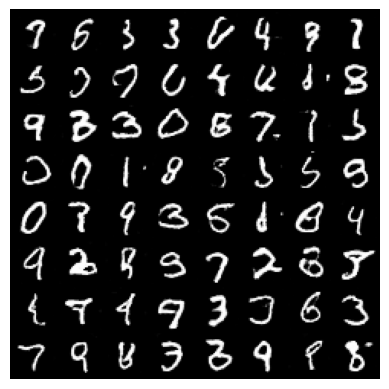

Epoch [61/100], Batch [100/938], D_real: 0.9793, D_fake: 0.0591, Loss_D: 0.1056, Loss_G: 4.7384
Epoch [61/100], Batch [200/938], D_real: 0.9649, D_fake: 0.1296, Loss_D: 0.2023, Loss_G: 3.3861
Epoch [61/100], Batch [300/938], D_real: 0.8889, D_fake: 0.0393, Loss_D: 0.2144, Loss_G: 5.7128
Epoch [61/100], Batch [400/938], D_real: 0.9969, D_fake: 0.1752, Loss_D: 0.2574, Loss_G: 2.7811
Epoch [61/100], Batch [500/938], D_real: 0.6398, D_fake: 0.0105, Loss_D: 0.6472, Loss_G: 5.0199
Epoch [61/100], Batch [600/938], D_real: 0.9220, D_fake: 0.0828, Loss_D: 0.2316, Loss_G: 3.7050
Epoch [61/100], Batch [700/938], D_real: 0.9725, D_fake: 0.1581, Loss_D: 0.2370, Loss_G: 4.3580
Epoch [61/100], Batch [800/938], D_real: 0.8395, D_fake: 0.0170, Loss_D: 0.2272, Loss_G: 4.3736
Epoch [61/100], Batch [900/938], D_real: 0.9861, D_fake: 0.0706, Loss_D: 0.0989, Loss_G: 4.5523


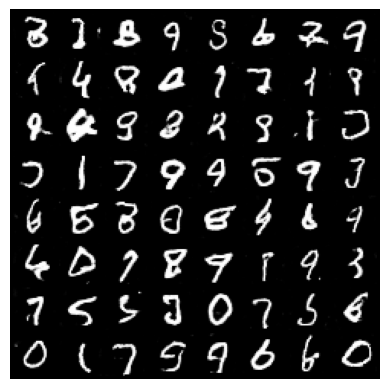

Epoch [62/100], Batch [100/938], D_real: 0.9589, D_fake: 0.0253, Loss_D: 0.0918, Loss_G: 4.8094
Epoch [62/100], Batch [200/938], D_real: 0.9972, D_fake: 0.1155, Loss_D: 0.1585, Loss_G: 4.7902
Epoch [62/100], Batch [300/938], D_real: 0.9059, D_fake: 0.0422, Loss_D: 0.1630, Loss_G: 5.4704
Epoch [62/100], Batch [400/938], D_real: 0.8154, D_fake: 0.0448, Loss_D: 0.3386, Loss_G: 4.0560
Epoch [62/100], Batch [500/938], D_real: 0.9993, D_fake: 0.3440, Loss_D: 0.6219, Loss_G: 3.4293
Epoch [62/100], Batch [600/938], D_real: 0.9012, D_fake: 0.0184, Loss_D: 0.1527, Loss_G: 4.7466
Epoch [62/100], Batch [700/938], D_real: 0.9242, D_fake: 0.0258, Loss_D: 0.1197, Loss_G: 5.6742
Epoch [62/100], Batch [800/938], D_real: 0.8888, D_fake: 0.0129, Loss_D: 0.1535, Loss_G: 5.9470
Epoch [62/100], Batch [900/938], D_real: 0.9931, D_fake: 0.1405, Loss_D: 0.2016, Loss_G: 3.8259


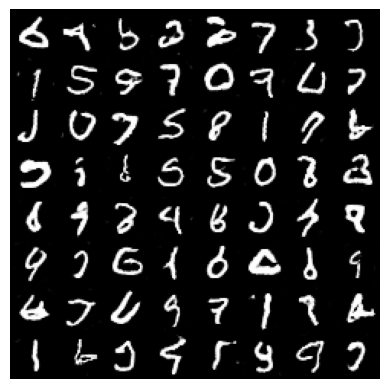

Epoch [63/100], Batch [100/938], D_real: 0.9774, D_fake: 0.0527, Loss_D: 0.0847, Loss_G: 3.9854
Epoch [63/100], Batch [200/938], D_real: 0.9232, D_fake: 0.0289, Loss_D: 0.1206, Loss_G: 4.0650
Epoch [63/100], Batch [300/938], D_real: 0.8850, D_fake: 0.0036, Loss_D: 0.1792, Loss_G: 6.4502
Epoch [63/100], Batch [400/938], D_real: 0.6273, D_fake: 0.0103, Loss_D: 0.8157, Loss_G: 3.9968
Epoch [63/100], Batch [500/938], D_real: 0.9782, D_fake: 0.0336, Loss_D: 0.0618, Loss_G: 5.4138
Epoch [63/100], Batch [600/938], D_real: 0.9348, D_fake: 0.0025, Loss_D: 0.0921, Loss_G: 6.4748
Epoch [63/100], Batch [700/938], D_real: 0.9373, D_fake: 0.0890, Loss_D: 0.1875, Loss_G: 3.5074
Epoch [63/100], Batch [800/938], D_real: 0.9316, D_fake: 0.0736, Loss_D: 0.1642, Loss_G: 4.1932
Epoch [63/100], Batch [900/938], D_real: 0.7882, D_fake: 0.0043, Loss_D: 0.3395, Loss_G: 7.3497


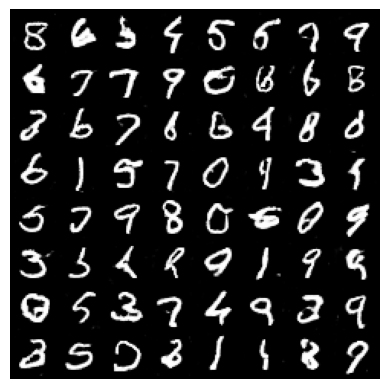

Epoch [64/100], Batch [100/938], D_real: 0.9683, D_fake: 0.0260, Loss_D: 0.0657, Loss_G: 5.1020
Epoch [64/100], Batch [200/938], D_real: 0.9893, D_fake: 0.1382, Loss_D: 0.1931, Loss_G: 2.0868
Epoch [64/100], Batch [300/938], D_real: 0.9928, D_fake: 0.2390, Loss_D: 0.4033, Loss_G: 3.7012
Epoch [64/100], Batch [400/938], D_real: 0.9954, D_fake: 0.0746, Loss_D: 0.1042, Loss_G: 4.2429
Epoch [64/100], Batch [500/938], D_real: 0.8712, D_fake: 0.0321, Loss_D: 0.1998, Loss_G: 5.0184
Epoch [64/100], Batch [600/938], D_real: 0.9848, D_fake: 0.1229, Loss_D: 0.1726, Loss_G: 3.0392
Epoch [64/100], Batch [700/938], D_real: 0.9686, D_fake: 0.0890, Loss_D: 0.1386, Loss_G: 5.0984
Epoch [64/100], Batch [800/938], D_real: 0.9753, D_fake: 0.0489, Loss_D: 0.0860, Loss_G: 4.2692
Epoch [64/100], Batch [900/938], D_real: 0.9502, D_fake: 0.1694, Loss_D: 0.2844, Loss_G: 2.5884


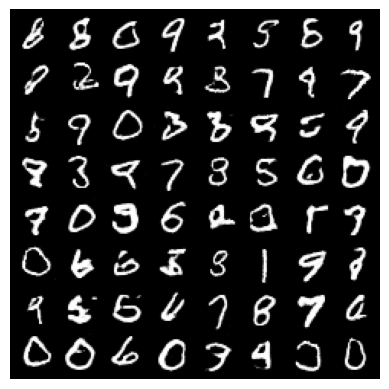

Epoch [65/100], Batch [100/938], D_real: 0.9095, D_fake: 0.0219, Loss_D: 0.1384, Loss_G: 5.5199
Epoch [65/100], Batch [200/938], D_real: 0.9274, D_fake: 0.0366, Loss_D: 0.1333, Loss_G: 3.8851
Epoch [65/100], Batch [300/938], D_real: 0.9482, D_fake: 0.0227, Loss_D: 0.0846, Loss_G: 4.3438
Epoch [65/100], Batch [400/938], D_real: 0.9790, D_fake: 0.0722, Loss_D: 0.1124, Loss_G: 3.8354
Epoch [65/100], Batch [500/938], D_real: 0.9732, D_fake: 0.0284, Loss_D: 0.0610, Loss_G: 4.6478
Epoch [65/100], Batch [600/938], D_real: 0.7805, D_fake: 0.0053, Loss_D: 0.3541, Loss_G: 5.8648
Epoch [65/100], Batch [700/938], D_real: 0.9960, D_fake: 0.2644, Loss_D: 0.4546, Loss_G: 5.1982
Epoch [65/100], Batch [800/938], D_real: 0.8418, D_fake: 0.0151, Loss_D: 0.2483, Loss_G: 5.2976
Epoch [65/100], Batch [900/938], D_real: 0.8280, D_fake: 0.0038, Loss_D: 0.2432, Loss_G: 7.3746


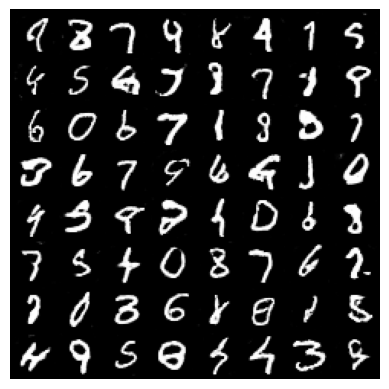

Epoch [66/100], Batch [100/938], D_real: 0.9789, D_fake: 0.0717, Loss_D: 0.1087, Loss_G: 3.9323
Epoch [66/100], Batch [200/938], D_real: 0.8017, D_fake: 0.0092, Loss_D: 0.3275, Loss_G: 6.7193
Epoch [66/100], Batch [300/938], D_real: 0.9773, D_fake: 0.0956, Loss_D: 0.1732, Loss_G: 3.9130
Epoch [66/100], Batch [400/938], D_real: 0.9831, D_fake: 0.1817, Loss_D: 0.2851, Loss_G: 4.1610
Epoch [66/100], Batch [500/938], D_real: 0.9557, D_fake: 0.0246, Loss_D: 0.0765, Loss_G: 3.9925
Epoch [66/100], Batch [600/938], D_real: 0.9755, D_fake: 0.1803, Loss_D: 0.2886, Loss_G: 2.3700
Epoch [66/100], Batch [700/938], D_real: 0.9536, D_fake: 0.0496, Loss_D: 0.1100, Loss_G: 5.0793
Epoch [66/100], Batch [800/938], D_real: 0.9934, D_fake: 0.1657, Loss_D: 0.2443, Loss_G: 3.1987
Epoch [66/100], Batch [900/938], D_real: 0.9850, D_fake: 0.0463, Loss_D: 0.0677, Loss_G: 4.2473


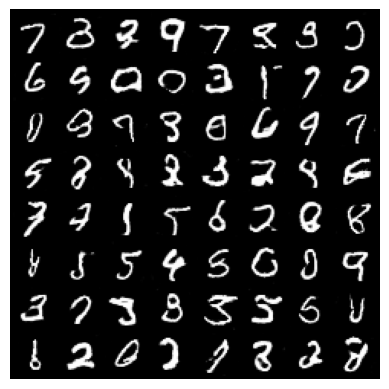

Epoch [67/100], Batch [100/938], D_real: 0.9594, D_fake: 0.0685, Loss_D: 0.1305, Loss_G: 4.6863
Epoch [67/100], Batch [200/938], D_real: 0.9539, D_fake: 0.0068, Loss_D: 0.0577, Loss_G: 6.1903
Epoch [67/100], Batch [300/938], D_real: 0.9816, D_fake: 0.0535, Loss_D: 0.0789, Loss_G: 4.4506
Epoch [67/100], Batch [400/938], D_real: 0.9641, D_fake: 0.0185, Loss_D: 0.0620, Loss_G: 6.0306
Epoch [67/100], Batch [500/938], D_real: 0.7208, D_fake: 0.0185, Loss_D: 0.4209, Loss_G: 2.8704
Epoch [67/100], Batch [600/938], D_real: 0.6935, D_fake: 0.0128, Loss_D: 0.5098, Loss_G: 5.5642
Epoch [67/100], Batch [700/938], D_real: 0.9488, D_fake: 0.0253, Loss_D: 0.0848, Loss_G: 6.1262
Epoch [67/100], Batch [800/938], D_real: 0.9893, D_fake: 0.1291, Loss_D: 0.1763, Loss_G: 3.1401
Epoch [67/100], Batch [900/938], D_real: 0.9352, D_fake: 0.1199, Loss_D: 0.2346, Loss_G: 3.6140


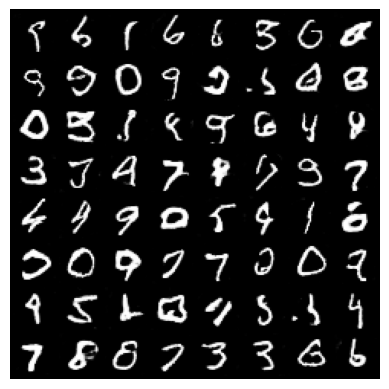

Epoch [68/100], Batch [100/938], D_real: 0.9053, D_fake: 0.0592, Loss_D: 0.1893, Loss_G: 4.3233
Epoch [68/100], Batch [200/938], D_real: 0.9633, D_fake: 0.0742, Loss_D: 0.1372, Loss_G: 4.2232
Epoch [68/100], Batch [300/938], D_real: 0.9524, D_fake: 0.0188, Loss_D: 0.0825, Loss_G: 4.6389
Epoch [68/100], Batch [400/938], D_real: 0.9910, D_fake: 0.1446, Loss_D: 0.2156, Loss_G: 2.6713
Epoch [68/100], Batch [500/938], D_real: 0.9526, D_fake: 0.0238, Loss_D: 0.0868, Loss_G: 5.0117
Epoch [68/100], Batch [600/938], D_real: 0.9160, D_fake: 0.0412, Loss_D: 0.1490, Loss_G: 3.4840
Epoch [68/100], Batch [700/938], D_real: 0.7963, D_fake: 0.0385, Loss_D: 0.3326, Loss_G: 4.6937
Epoch [68/100], Batch [800/938], D_real: 0.8996, D_fake: 0.0422, Loss_D: 0.1802, Loss_G: 6.6058
Epoch [68/100], Batch [900/938], D_real: 0.9670, D_fake: 0.0642, Loss_D: 0.1100, Loss_G: 4.9610


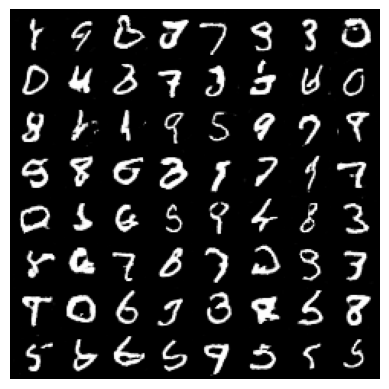

Epoch [69/100], Batch [100/938], D_real: 0.9734, D_fake: 0.0489, Loss_D: 0.0920, Loss_G: 2.4114
Epoch [69/100], Batch [200/938], D_real: 0.9825, D_fake: 0.0683, Loss_D: 0.1139, Loss_G: 4.1712
Epoch [69/100], Batch [300/938], D_real: 0.9952, D_fake: 0.1287, Loss_D: 0.2053, Loss_G: 3.7513
Epoch [69/100], Batch [400/938], D_real: 0.9894, D_fake: 0.1161, Loss_D: 0.1565, Loss_G: 4.2744
Epoch [69/100], Batch [500/938], D_real: 0.9659, D_fake: 0.0756, Loss_D: 0.1306, Loss_G: 4.1609
Epoch [69/100], Batch [600/938], D_real: 0.9162, D_fake: 0.0195, Loss_D: 0.1238, Loss_G: 5.5767
Epoch [69/100], Batch [700/938], D_real: 0.9910, D_fake: 0.0835, Loss_D: 0.1104, Loss_G: 4.0669
Epoch [69/100], Batch [800/938], D_real: 0.9111, D_fake: 0.0215, Loss_D: 0.1306, Loss_G: 4.9779
Epoch [69/100], Batch [900/938], D_real: 0.9878, D_fake: 0.0579, Loss_D: 0.0773, Loss_G: 4.3981


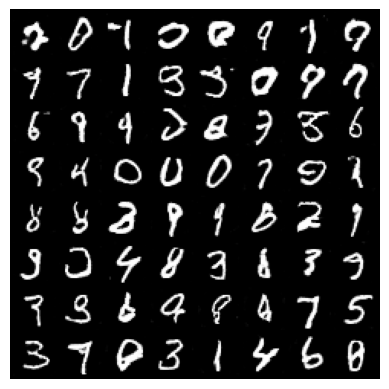

Epoch [70/100], Batch [100/938], D_real: 0.9520, D_fake: 0.0623, Loss_D: 0.1273, Loss_G: 4.3479
Epoch [70/100], Batch [200/938], D_real: 0.9828, D_fake: 0.0579, Loss_D: 0.0892, Loss_G: 2.1657
Epoch [70/100], Batch [300/938], D_real: 0.9947, D_fake: 0.1957, Loss_D: 0.3041, Loss_G: 4.5684
Epoch [70/100], Batch [400/938], D_real: 0.9127, D_fake: 0.1118, Loss_D: 0.2799, Loss_G: 4.8685
Epoch [70/100], Batch [500/938], D_real: 0.9488, D_fake: 0.0590, Loss_D: 0.1291, Loss_G: 4.8780
Epoch [70/100], Batch [600/938], D_real: 0.9959, D_fake: 0.1437, Loss_D: 0.1911, Loss_G: 2.5169
Epoch [70/100], Batch [700/938], D_real: 0.9978, D_fake: 0.2217, Loss_D: 0.3504, Loss_G: 3.4386
Epoch [70/100], Batch [800/938], D_real: 0.9885, D_fake: 0.1680, Loss_D: 0.2558, Loss_G: 3.4206
Epoch [70/100], Batch [900/938], D_real: 0.9259, D_fake: 0.0597, Loss_D: 0.1596, Loss_G: 2.9614


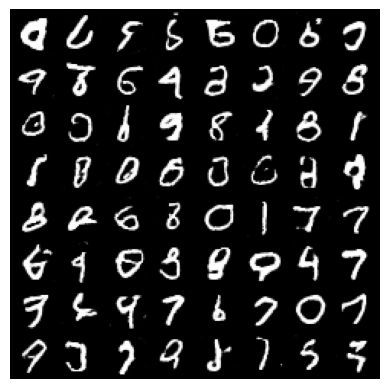

Epoch [71/100], Batch [100/938], D_real: 0.9541, D_fake: 0.0377, Loss_D: 0.1037, Loss_G: 5.8618
Epoch [71/100], Batch [200/938], D_real: 0.9633, D_fake: 0.0715, Loss_D: 0.1245, Loss_G: 4.8173
Epoch [71/100], Batch [300/938], D_real: 0.9717, D_fake: 0.0342, Loss_D: 0.0736, Loss_G: 3.3962
Epoch [71/100], Batch [400/938], D_real: 0.9192, D_fake: 0.0280, Loss_D: 0.1314, Loss_G: 3.7867
Epoch [71/100], Batch [500/938], D_real: 0.8607, D_fake: 0.0412, Loss_D: 0.2367, Loss_G: 5.1508
Epoch [71/100], Batch [600/938], D_real: 0.9660, D_fake: 0.1793, Loss_D: 0.3287, Loss_G: 5.2763
Epoch [71/100], Batch [700/938], D_real: 0.9935, D_fake: 0.0486, Loss_D: 0.0631, Loss_G: 4.6984
Epoch [71/100], Batch [800/938], D_real: 0.9768, D_fake: 0.0307, Loss_D: 0.0614, Loss_G: 5.5885
Epoch [71/100], Batch [900/938], D_real: 0.7969, D_fake: 0.0263, Loss_D: 0.3257, Loss_G: 3.8080


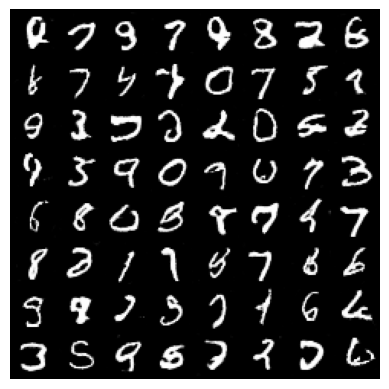

Epoch [72/100], Batch [100/938], D_real: 0.9484, D_fake: 0.0305, Loss_D: 0.1049, Loss_G: 5.5345
Epoch [72/100], Batch [200/938], D_real: 0.9162, D_fake: 0.0561, Loss_D: 0.1684, Loss_G: 4.6506
Epoch [72/100], Batch [300/938], D_real: 0.9832, D_fake: 0.0503, Loss_D: 0.0788, Loss_G: 4.2392
Epoch [72/100], Batch [400/938], D_real: 0.9646, D_fake: 0.0404, Loss_D: 0.0964, Loss_G: 5.6049
Epoch [72/100], Batch [500/938], D_real: 0.9888, D_fake: 0.1441, Loss_D: 0.2171, Loss_G: 4.5575
Epoch [72/100], Batch [600/938], D_real: 0.9189, D_fake: 0.0473, Loss_D: 0.1551, Loss_G: 6.1858
Epoch [72/100], Batch [700/938], D_real: 0.9863, D_fake: 0.1253, Loss_D: 0.2116, Loss_G: 5.7112
Epoch [72/100], Batch [800/938], D_real: 0.8400, D_fake: 0.1314, Loss_D: 0.4342, Loss_G: 4.3281
Epoch [72/100], Batch [900/938], D_real: 0.9987, D_fake: 0.1133, Loss_D: 0.1387, Loss_G: 4.0832


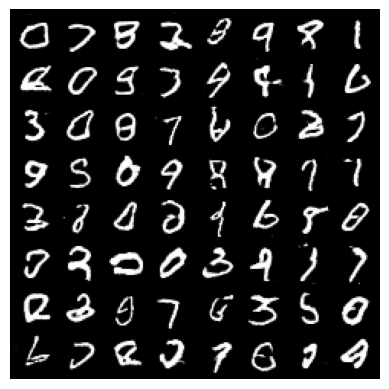

Epoch [73/100], Batch [100/938], D_real: 0.9760, D_fake: 0.0445, Loss_D: 0.0744, Loss_G: 3.9594
Epoch [73/100], Batch [200/938], D_real: 0.9558, D_fake: 0.1218, Loss_D: 0.2143, Loss_G: 3.8913
Epoch [73/100], Batch [300/938], D_real: 0.9393, D_fake: 0.0480, Loss_D: 0.1251, Loss_G: 4.2350
Epoch [73/100], Batch [400/938], D_real: 0.9923, D_fake: 0.1363, Loss_D: 0.1901, Loss_G: 4.2748
Epoch [73/100], Batch [500/938], D_real: 0.9471, D_fake: 0.0349, Loss_D: 0.0962, Loss_G: 3.2569
Epoch [73/100], Batch [600/938], D_real: 0.9348, D_fake: 0.1403, Loss_D: 0.2566, Loss_G: 3.5155
Epoch [73/100], Batch [700/938], D_real: 0.9156, D_fake: 0.0057, Loss_D: 0.1088, Loss_G: 6.9480
Epoch [73/100], Batch [800/938], D_real: 0.9434, D_fake: 0.0597, Loss_D: 0.1434, Loss_G: 4.3480
Epoch [73/100], Batch [900/938], D_real: 0.9389, D_fake: 0.0546, Loss_D: 0.1290, Loss_G: 3.8150


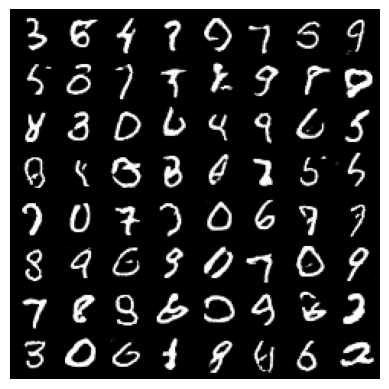

Epoch [74/100], Batch [100/938], D_real: 0.9986, D_fake: 0.2281, Loss_D: 0.3544, Loss_G: 3.9460
Epoch [74/100], Batch [200/938], D_real: 0.9697, D_fake: 0.0618, Loss_D: 0.1045, Loss_G: 3.6162
Epoch [74/100], Batch [300/938], D_real: 0.9515, D_fake: 0.1016, Loss_D: 0.2276, Loss_G: 4.1775
Epoch [74/100], Batch [400/938], D_real: 0.9580, D_fake: 0.0696, Loss_D: 0.1332, Loss_G: 5.1348
Epoch [74/100], Batch [500/938], D_real: 0.9262, D_fake: 0.0182, Loss_D: 0.1023, Loss_G: 5.8676
Epoch [74/100], Batch [600/938], D_real: 0.9684, D_fake: 0.0233, Loss_D: 0.0647, Loss_G: 6.8630
Epoch [74/100], Batch [700/938], D_real: 0.9053, D_fake: 0.0456, Loss_D: 0.1933, Loss_G: 4.6655
Epoch [74/100], Batch [800/938], D_real: 0.8110, D_fake: 0.0581, Loss_D: 0.3753, Loss_G: 2.6650
Epoch [74/100], Batch [900/938], D_real: 0.9011, D_fake: 0.0575, Loss_D: 0.1916, Loss_G: 3.0080


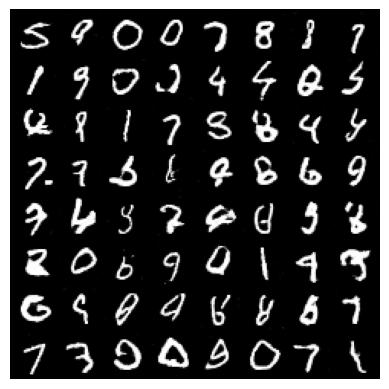

Epoch [75/100], Batch [100/938], D_real: 0.9880, D_fake: 0.0691, Loss_D: 0.1001, Loss_G: 5.3298
Epoch [75/100], Batch [200/938], D_real: 0.9336, D_fake: 0.0548, Loss_D: 0.1448, Loss_G: 3.8122
Epoch [75/100], Batch [300/938], D_real: 0.6611, D_fake: 0.0079, Loss_D: 0.5710, Loss_G: 3.6331
Epoch [75/100], Batch [400/938], D_real: 0.8960, D_fake: 0.0206, Loss_D: 0.1470, Loss_G: 6.2193
Epoch [75/100], Batch [500/938], D_real: 0.8326, D_fake: 0.0191, Loss_D: 0.2630, Loss_G: 4.4787
Epoch [75/100], Batch [600/938], D_real: 0.9629, D_fake: 0.0416, Loss_D: 0.0861, Loss_G: 5.2049
Epoch [75/100], Batch [700/938], D_real: 0.9347, D_fake: 0.0346, Loss_D: 0.1228, Loss_G: 4.8711
Epoch [75/100], Batch [800/938], D_real: 0.9888, D_fake: 0.1215, Loss_D: 0.1729, Loss_G: 3.8279
Epoch [75/100], Batch [900/938], D_real: 0.9423, D_fake: 0.0049, Loss_D: 0.0696, Loss_G: 5.5608


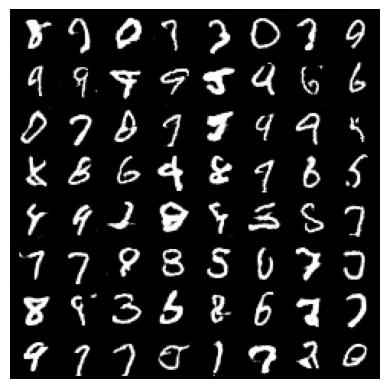

Epoch [76/100], Batch [100/938], D_real: 0.9793, D_fake: 0.0867, Loss_D: 0.1413, Loss_G: 3.3322
Epoch [76/100], Batch [200/938], D_real: 0.9888, D_fake: 0.1086, Loss_D: 0.1427, Loss_G: 2.9898
Epoch [76/100], Batch [300/938], D_real: 0.9226, D_fake: 0.2265, Loss_D: 0.4210, Loss_G: 3.1615
Epoch [76/100], Batch [400/938], D_real: 0.9527, D_fake: 0.0819, Loss_D: 0.1485, Loss_G: 4.0797
Epoch [76/100], Batch [500/938], D_real: 0.9749, D_fake: 0.0536, Loss_D: 0.0855, Loss_G: 4.1681
Epoch [76/100], Batch [600/938], D_real: 0.9050, D_fake: 0.0653, Loss_D: 0.2087, Loss_G: 5.8938
Epoch [76/100], Batch [700/938], D_real: 0.9955, D_fake: 0.0973, Loss_D: 0.1269, Loss_G: 2.9404
Epoch [76/100], Batch [800/938], D_real: 0.9850, D_fake: 0.0340, Loss_D: 0.0558, Loss_G: 5.6326
Epoch [76/100], Batch [900/938], D_real: 0.8744, D_fake: 0.0330, Loss_D: 0.1883, Loss_G: 5.5797


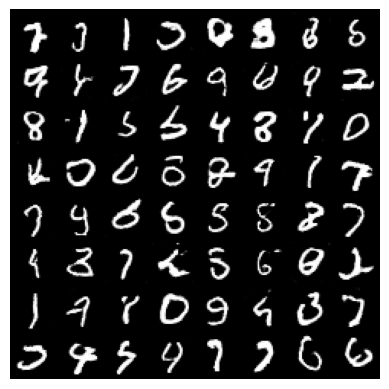

Epoch [77/100], Batch [100/938], D_real: 0.9548, D_fake: 0.0076, Loss_D: 0.0586, Loss_G: 6.6180
Epoch [77/100], Batch [200/938], D_real: 0.9731, D_fake: 0.0618, Loss_D: 0.1047, Loss_G: 4.9613
Epoch [77/100], Batch [300/938], D_real: 0.9018, D_fake: 0.0210, Loss_D: 0.1495, Loss_G: 4.6862
Epoch [77/100], Batch [400/938], D_real: 0.9012, D_fake: 0.0115, Loss_D: 0.1276, Loss_G: 4.2078
Epoch [77/100], Batch [500/938], D_real: 0.8873, D_fake: 0.0185, Loss_D: 0.1643, Loss_G: 4.8034
Epoch [77/100], Batch [600/938], D_real: 0.9660, D_fake: 0.0826, Loss_D: 0.1523, Loss_G: 5.0170
Epoch [77/100], Batch [700/938], D_real: 0.9723, D_fake: 0.1067, Loss_D: 0.1577, Loss_G: 3.8230
Epoch [77/100], Batch [800/938], D_real: 0.9663, D_fake: 0.0313, Loss_D: 0.0817, Loss_G: 4.6711
Epoch [77/100], Batch [900/938], D_real: 0.8957, D_fake: 0.0158, Loss_D: 0.1452, Loss_G: 5.2953


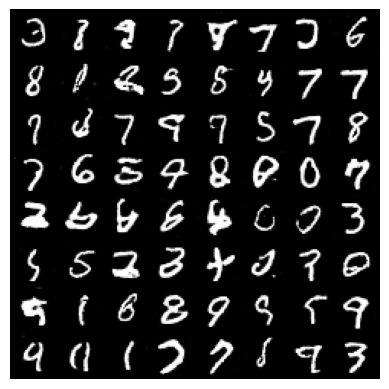

Epoch [78/100], Batch [100/938], D_real: 0.6203, D_fake: 0.0010, Loss_D: 0.6512, Loss_G: 7.0240
Epoch [78/100], Batch [200/938], D_real: 0.9902, D_fake: 0.2257, Loss_D: 0.3920, Loss_G: 2.3309
Epoch [78/100], Batch [300/938], D_real: 0.7784, D_fake: 0.0065, Loss_D: 0.3987, Loss_G: 6.0188
Epoch [78/100], Batch [400/938], D_real: 0.9972, D_fake: 0.1684, Loss_D: 0.2676, Loss_G: 4.6073
Epoch [78/100], Batch [500/938], D_real: 0.9824, D_fake: 0.1194, Loss_D: 0.1857, Loss_G: 3.8694
Epoch [78/100], Batch [600/938], D_real: 0.9786, D_fake: 0.1425, Loss_D: 0.2358, Loss_G: 5.1828
Epoch [78/100], Batch [700/938], D_real: 0.9759, D_fake: 0.1124, Loss_D: 0.2057, Loss_G: 4.3867
Epoch [78/100], Batch [800/938], D_real: 0.9770, D_fake: 0.0284, Loss_D: 0.0579, Loss_G: 4.0054
Epoch [78/100], Batch [900/938], D_real: 0.9367, D_fake: 0.0119, Loss_D: 0.0892, Loss_G: 6.4966


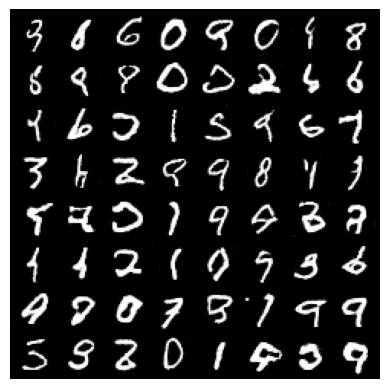

Epoch [79/100], Batch [100/938], D_real: 0.9163, D_fake: 0.0158, Loss_D: 0.1218, Loss_G: 5.9439
Epoch [79/100], Batch [200/938], D_real: 0.8432, D_fake: 0.0457, Loss_D: 0.2835, Loss_G: 5.6294
Epoch [79/100], Batch [300/938], D_real: 0.9829, D_fake: 0.0609, Loss_D: 0.0880, Loss_G: 4.8503
Epoch [79/100], Batch [400/938], D_real: 0.9716, D_fake: 0.0783, Loss_D: 0.1607, Loss_G: 4.6050
Epoch [79/100], Batch [500/938], D_real: 0.8713, D_fake: 0.0224, Loss_D: 0.1901, Loss_G: 5.0353
Epoch [79/100], Batch [600/938], D_real: 0.9481, D_fake: 0.0431, Loss_D: 0.1121, Loss_G: 5.2558
Epoch [79/100], Batch [700/938], D_real: 0.9615, D_fake: 0.0827, Loss_D: 0.1430, Loss_G: 6.1061
Epoch [79/100], Batch [800/938], D_real: 0.9798, D_fake: 0.2592, Loss_D: 0.4477, Loss_G: 3.5984
Epoch [79/100], Batch [900/938], D_real: 0.9888, D_fake: 0.0464, Loss_D: 0.0657, Loss_G: 4.6755


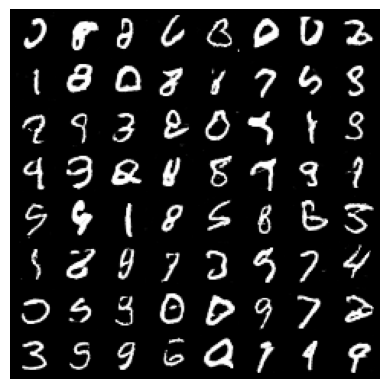

Epoch [80/100], Batch [100/938], D_real: 0.8786, D_fake: 0.0351, Loss_D: 0.1899, Loss_G: 4.0020
Epoch [80/100], Batch [200/938], D_real: 0.9137, D_fake: 0.0313, Loss_D: 0.1613, Loss_G: 3.6541
Epoch [80/100], Batch [300/938], D_real: 0.9935, D_fake: 0.2169, Loss_D: 0.3251, Loss_G: 3.0967
Epoch [80/100], Batch [400/938], D_real: 0.9675, D_fake: 0.0281, Loss_D: 0.0648, Loss_G: 5.6891
Epoch [80/100], Batch [500/938], D_real: 0.9885, D_fake: 0.0737, Loss_D: 0.1385, Loss_G: 4.5909
Epoch [80/100], Batch [600/938], D_real: 0.9747, D_fake: 0.0365, Loss_D: 0.0880, Loss_G: 6.1735
Epoch [80/100], Batch [700/938], D_real: 0.9611, D_fake: 0.0179, Loss_D: 0.0611, Loss_G: 5.6106
Epoch [80/100], Batch [800/938], D_real: 0.9551, D_fake: 0.0710, Loss_D: 0.1641, Loss_G: 4.7876
Epoch [80/100], Batch [900/938], D_real: 0.8550, D_fake: 0.0067, Loss_D: 0.1896, Loss_G: 7.1537


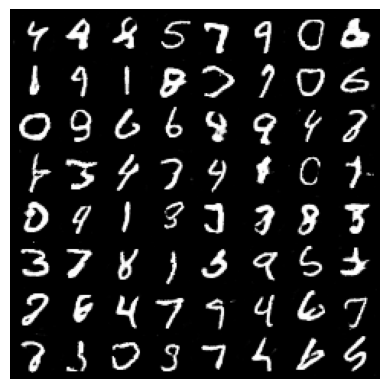

Epoch [81/100], Batch [100/938], D_real: 0.9529, D_fake: 0.0129, Loss_D: 0.0641, Loss_G: 5.1620
Epoch [81/100], Batch [200/938], D_real: 0.9660, D_fake: 0.0459, Loss_D: 0.0989, Loss_G: 4.3859
Epoch [81/100], Batch [300/938], D_real: 0.9918, D_fake: 0.1396, Loss_D: 0.2091, Loss_G: 2.6955
Epoch [81/100], Batch [400/938], D_real: 0.8162, D_fake: 0.0079, Loss_D: 0.2596, Loss_G: 5.5002
Epoch [81/100], Batch [500/938], D_real: 0.9637, D_fake: 0.0478, Loss_D: 0.1194, Loss_G: 4.7064
Epoch [81/100], Batch [600/938], D_real: 0.8012, D_fake: 0.0084, Loss_D: 0.3226, Loss_G: 5.5811
Epoch [81/100], Batch [700/938], D_real: 0.5701, D_fake: 0.0024, Loss_D: 0.8617, Loss_G: 4.3269
Epoch [81/100], Batch [800/938], D_real: 0.9799, D_fake: 0.1635, Loss_D: 0.2647, Loss_G: 4.7093
Epoch [81/100], Batch [900/938], D_real: 0.8964, D_fake: 0.0533, Loss_D: 0.1877, Loss_G: 5.2578


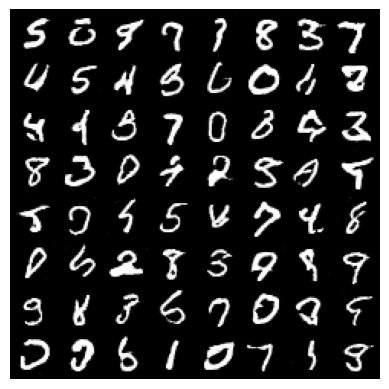

Epoch [82/100], Batch [100/938], D_real: 0.9730, D_fake: 0.1221, Loss_D: 0.1871, Loss_G: 3.2517
Epoch [82/100], Batch [200/938], D_real: 0.9776, D_fake: 0.0177, Loss_D: 0.0420, Loss_G: 5.3578
Epoch [82/100], Batch [300/938], D_real: 0.9958, D_fake: 0.0658, Loss_D: 0.0780, Loss_G: 4.1096
Epoch [82/100], Batch [400/938], D_real: 0.9835, D_fake: 0.1294, Loss_D: 0.1905, Loss_G: 2.8309
Epoch [82/100], Batch [500/938], D_real: 0.9961, D_fake: 0.1438, Loss_D: 0.2473, Loss_G: 3.0474
Epoch [82/100], Batch [600/938], D_real: 0.9351, D_fake: 0.0340, Loss_D: 0.1106, Loss_G: 5.3301
Epoch [82/100], Batch [700/938], D_real: 0.8927, D_fake: 0.0041, Loss_D: 0.1510, Loss_G: 8.0161
Epoch [82/100], Batch [800/938], D_real: 0.9962, D_fake: 0.0876, Loss_D: 0.1102, Loss_G: 3.4970
Epoch [82/100], Batch [900/938], D_real: 0.9573, D_fake: 0.0805, Loss_D: 0.1578, Loss_G: 4.3078


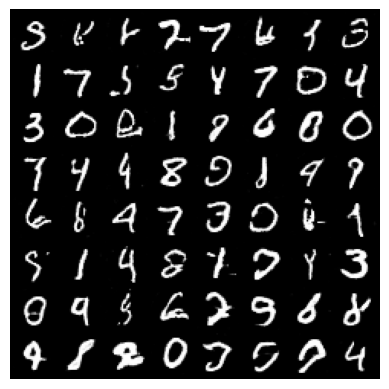

Epoch [83/100], Batch [100/938], D_real: 0.9509, D_fake: 0.0169, Loss_D: 0.0723, Loss_G: 4.3478
Epoch [83/100], Batch [200/938], D_real: 0.9879, D_fake: 0.0442, Loss_D: 0.0598, Loss_G: 4.0588
Epoch [83/100], Batch [300/938], D_real: 0.9754, D_fake: 0.0920, Loss_D: 0.1430, Loss_G: 3.4130
Epoch [83/100], Batch [400/938], D_real: 0.9721, D_fake: 0.0117, Loss_D: 0.0419, Loss_G: 8.5757
Epoch [83/100], Batch [500/938], D_real: 0.8756, D_fake: 0.0650, Loss_D: 0.2435, Loss_G: 4.0946
Epoch [83/100], Batch [600/938], D_real: 0.8853, D_fake: 0.0531, Loss_D: 0.2131, Loss_G: 3.9430
Epoch [83/100], Batch [700/938], D_real: 0.8204, D_fake: 0.0433, Loss_D: 0.3202, Loss_G: 3.2789
Epoch [83/100], Batch [800/938], D_real: 0.9014, D_fake: 0.0881, Loss_D: 0.2296, Loss_G: 2.9678
Epoch [83/100], Batch [900/938], D_real: 0.9718, D_fake: 0.0841, Loss_D: 0.1322, Loss_G: 4.7647


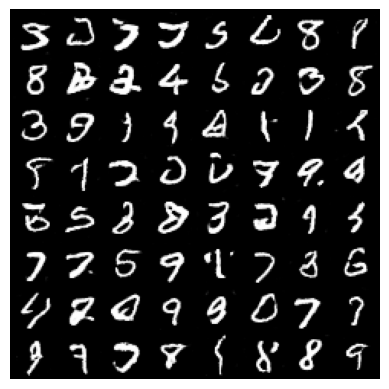

Epoch [84/100], Batch [100/938], D_real: 0.9841, D_fake: 0.0676, Loss_D: 0.1004, Loss_G: 3.8104
Epoch [84/100], Batch [200/938], D_real: 0.9055, D_fake: 0.0683, Loss_D: 0.2480, Loss_G: 4.1762
Epoch [84/100], Batch [300/938], D_real: 0.9262, D_fake: 0.0164, Loss_D: 0.1044, Loss_G: 5.6552
Epoch [84/100], Batch [400/938], D_real: 0.9537, D_fake: 0.0638, Loss_D: 0.1293, Loss_G: 5.3893
Epoch [84/100], Batch [500/938], D_real: 0.9954, D_fake: 0.2678, Loss_D: 0.4325, Loss_G: 5.1365
Epoch [84/100], Batch [600/938], D_real: 0.9598, D_fake: 0.0290, Loss_D: 0.0744, Loss_G: 3.9825
Epoch [84/100], Batch [700/938], D_real: 0.9694, D_fake: 0.0336, Loss_D: 0.0729, Loss_G: 7.5102
Epoch [84/100], Batch [800/938], D_real: 0.9835, D_fake: 0.0504, Loss_D: 0.0789, Loss_G: 4.6772
Epoch [84/100], Batch [900/938], D_real: 0.9899, D_fake: 0.0175, Loss_D: 0.0290, Loss_G: 5.8386


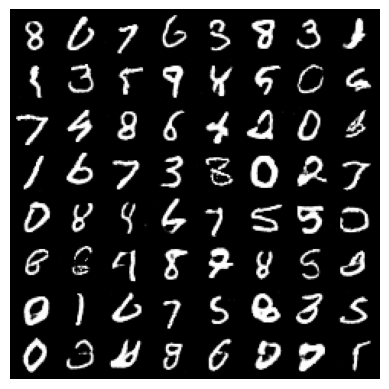

Epoch [85/100], Batch [100/938], D_real: 0.9875, D_fake: 0.1018, Loss_D: 0.1440, Loss_G: 4.6688
Epoch [85/100], Batch [200/938], D_real: 0.9141, D_fake: 0.0374, Loss_D: 0.1663, Loss_G: 4.6554
Epoch [85/100], Batch [300/938], D_real: 0.9862, D_fake: 0.2560, Loss_D: 0.4043, Loss_G: 2.3340
Epoch [85/100], Batch [400/938], D_real: 0.9878, D_fake: 0.1955, Loss_D: 0.3737, Loss_G: 2.9425
Epoch [85/100], Batch [500/938], D_real: 0.8801, D_fake: 0.0850, Loss_D: 0.2659, Loss_G: 4.8639
Epoch [85/100], Batch [600/938], D_real: 0.9701, D_fake: 0.0575, Loss_D: 0.0996, Loss_G: 4.7455
Epoch [85/100], Batch [700/938], D_real: 0.9627, D_fake: 0.0440, Loss_D: 0.0940, Loss_G: 5.5936
Epoch [85/100], Batch [800/938], D_real: 0.9128, D_fake: 0.0293, Loss_D: 0.1447, Loss_G: 4.8406
Epoch [85/100], Batch [900/938], D_real: 0.9831, D_fake: 0.1159, Loss_D: 0.1740, Loss_G: 4.4506


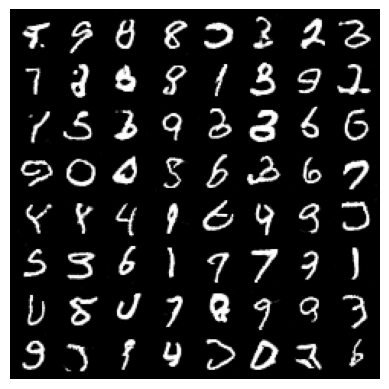

Epoch [86/100], Batch [100/938], D_real: 0.8235, D_fake: 0.0408, Loss_D: 0.3130, Loss_G: 3.7390
Epoch [86/100], Batch [200/938], D_real: 0.9738, D_fake: 0.1538, Loss_D: 0.2943, Loss_G: 3.6415
Epoch [86/100], Batch [300/938], D_real: 0.9747, D_fake: 0.1667, Loss_D: 0.2757, Loss_G: 4.4077
Epoch [86/100], Batch [400/938], D_real: 0.9710, D_fake: 0.0821, Loss_D: 0.1309, Loss_G: 5.0137
Epoch [86/100], Batch [500/938], D_real: 0.9341, D_fake: 0.0163, Loss_D: 0.0968, Loss_G: 6.6938
Epoch [86/100], Batch [600/938], D_real: 0.9812, D_fake: 0.0629, Loss_D: 0.0913, Loss_G: 3.3466
Epoch [86/100], Batch [700/938], D_real: 0.9194, D_fake: 0.0151, Loss_D: 0.1097, Loss_G: 4.3860
Epoch [86/100], Batch [800/938], D_real: 0.7263, D_fake: 0.0278, Loss_D: 0.5062, Loss_G: 3.8513
Epoch [86/100], Batch [900/938], D_real: 0.8679, D_fake: 0.0060, Loss_D: 0.1652, Loss_G: 6.8075


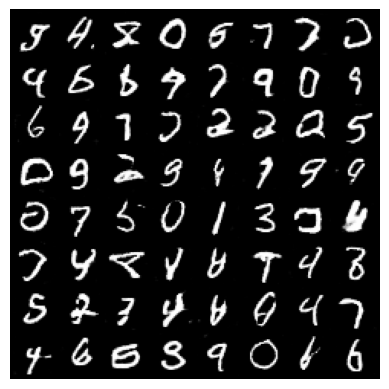

Epoch [87/100], Batch [100/938], D_real: 0.8735, D_fake: 0.0349, Loss_D: 0.2065, Loss_G: 3.5297
Epoch [87/100], Batch [200/938], D_real: 0.9785, D_fake: 0.0489, Loss_D: 0.0804, Loss_G: 4.6695
Epoch [87/100], Batch [300/938], D_real: 0.9613, D_fake: 0.1673, Loss_D: 0.3284, Loss_G: 3.1781
Epoch [87/100], Batch [400/938], D_real: 0.8642, D_fake: 0.0157, Loss_D: 0.2004, Loss_G: 4.7794
Epoch [87/100], Batch [500/938], D_real: 0.9548, D_fake: 0.0108, Loss_D: 0.0594, Loss_G: 5.2766
Epoch [87/100], Batch [600/938], D_real: 0.9857, D_fake: 0.1203, Loss_D: 0.1765, Loss_G: 4.1508
Epoch [87/100], Batch [700/938], D_real: 0.9904, D_fake: 0.1187, Loss_D: 0.1843, Loss_G: 3.6556
Epoch [87/100], Batch [800/938], D_real: 0.9790, D_fake: 0.1136, Loss_D: 0.1749, Loss_G: 4.4600
Epoch [87/100], Batch [900/938], D_real: 0.8548, D_fake: 0.0770, Loss_D: 0.2874, Loss_G: 3.2084


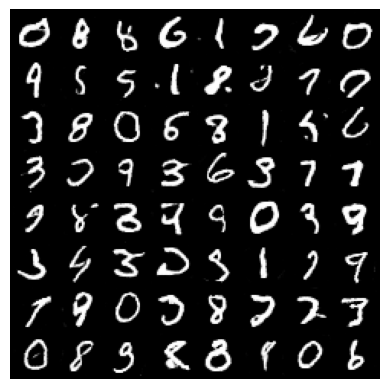

Epoch [88/100], Batch [100/938], D_real: 0.9846, D_fake: 0.1600, Loss_D: 0.2474, Loss_G: 3.6664
Epoch [88/100], Batch [200/938], D_real: 0.9614, D_fake: 0.0851, Loss_D: 0.1468, Loss_G: 4.8807
Epoch [88/100], Batch [300/938], D_real: 0.8381, D_fake: 0.0116, Loss_D: 0.2214, Loss_G: 6.2239
Epoch [88/100], Batch [400/938], D_real: 0.9407, D_fake: 0.0659, Loss_D: 0.1482, Loss_G: 3.5645
Epoch [88/100], Batch [500/938], D_real: 0.9746, D_fake: 0.0770, Loss_D: 0.1167, Loss_G: 4.1161
Epoch [88/100], Batch [600/938], D_real: 0.9918, D_fake: 0.0474, Loss_D: 0.0604, Loss_G: 3.2161
Epoch [88/100], Batch [700/938], D_real: 0.9441, D_fake: 0.0871, Loss_D: 0.1848, Loss_G: 2.5032
Epoch [88/100], Batch [800/938], D_real: 0.9328, D_fake: 0.0848, Loss_D: 0.1880, Loss_G: 2.9272
Epoch [88/100], Batch [900/938], D_real: 0.7687, D_fake: 0.0105, Loss_D: 0.3892, Loss_G: 3.5239


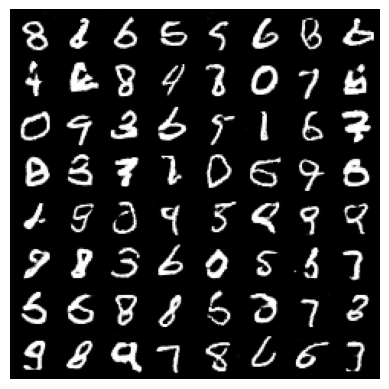

Epoch [89/100], Batch [100/938], D_real: 0.8393, D_fake: 0.0275, Loss_D: 0.2538, Loss_G: 6.1624
Epoch [89/100], Batch [200/938], D_real: 0.9683, D_fake: 0.0260, Loss_D: 0.0680, Loss_G: 6.2358
Epoch [89/100], Batch [300/938], D_real: 0.9038, D_fake: 0.0206, Loss_D: 0.1435, Loss_G: 5.4719
Epoch [89/100], Batch [400/938], D_real: 0.9763, D_fake: 0.0380, Loss_D: 0.0687, Loss_G: 5.2642
Epoch [89/100], Batch [500/938], D_real: 0.9712, D_fake: 0.0321, Loss_D: 0.0686, Loss_G: 4.9495
Epoch [89/100], Batch [600/938], D_real: 0.9552, D_fake: 0.0679, Loss_D: 0.1308, Loss_G: 4.7516
Epoch [89/100], Batch [700/938], D_real: 0.9748, D_fake: 0.0486, Loss_D: 0.0946, Loss_G: 5.7644
Epoch [89/100], Batch [800/938], D_real: 0.9484, D_fake: 0.0137, Loss_D: 0.0723, Loss_G: 6.6771
Epoch [89/100], Batch [900/938], D_real: 0.9882, D_fake: 0.1720, Loss_D: 0.2601, Loss_G: 3.4260


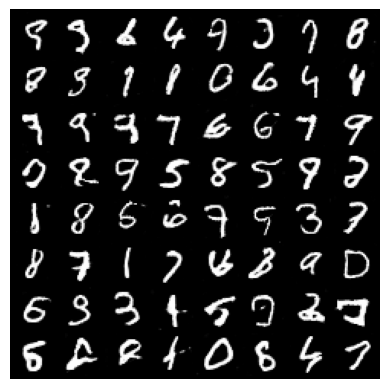

Epoch [90/100], Batch [100/938], D_real: 0.9772, D_fake: 0.0899, Loss_D: 0.1361, Loss_G: 3.9501
Epoch [90/100], Batch [200/938], D_real: 0.9548, D_fake: 0.0300, Loss_D: 0.0843, Loss_G: 5.4342
Epoch [90/100], Batch [300/938], D_real: 0.9838, D_fake: 0.1411, Loss_D: 0.2111, Loss_G: 4.4817
Epoch [90/100], Batch [400/938], D_real: 0.9477, D_fake: 0.0308, Loss_D: 0.0965, Loss_G: 5.8995
Epoch [90/100], Batch [500/938], D_real: 0.9569, D_fake: 0.0247, Loss_D: 0.0744, Loss_G: 6.1636
Epoch [90/100], Batch [600/938], D_real: 0.9668, D_fake: 0.2621, Loss_D: 0.5446, Loss_G: 4.0611
Epoch [90/100], Batch [700/938], D_real: 0.9320, D_fake: 0.1318, Loss_D: 0.2715, Loss_G: 4.1821
Epoch [90/100], Batch [800/938], D_real: 0.9459, D_fake: 0.0973, Loss_D: 0.1908, Loss_G: 4.0221
Epoch [90/100], Batch [900/938], D_real: 0.9225, D_fake: 0.0769, Loss_D: 0.1899, Loss_G: 4.1632


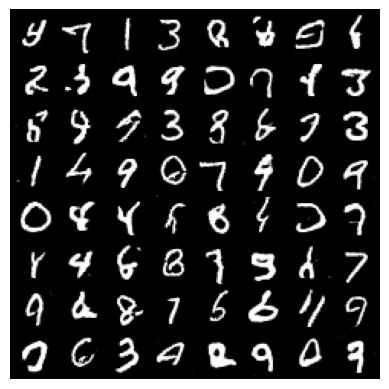

Epoch [91/100], Batch [100/938], D_real: 0.9719, D_fake: 0.0314, Loss_D: 0.0678, Loss_G: 4.7396
Epoch [91/100], Batch [200/938], D_real: 0.9928, D_fake: 0.2308, Loss_D: 0.3535, Loss_G: 4.6912
Epoch [91/100], Batch [300/938], D_real: 0.9556, D_fake: 0.0299, Loss_D: 0.0921, Loss_G: 5.3070
Epoch [91/100], Batch [400/938], D_real: 0.9207, D_fake: 0.0443, Loss_D: 0.1431, Loss_G: 3.8666
Epoch [91/100], Batch [500/938], D_real: 0.6427, D_fake: 0.0037, Loss_D: 0.5492, Loss_G: 6.0635
Epoch [91/100], Batch [600/938], D_real: 0.9760, D_fake: 0.0224, Loss_D: 0.0482, Loss_G: 6.0361
Epoch [91/100], Batch [700/938], D_real: 0.9826, D_fake: 0.0917, Loss_D: 0.1391, Loss_G: 5.7562
Epoch [91/100], Batch [800/938], D_real: 0.9579, D_fake: 0.0659, Loss_D: 0.1374, Loss_G: 4.0450
Epoch [91/100], Batch [900/938], D_real: 0.9698, D_fake: 0.0435, Loss_D: 0.0868, Loss_G: 4.9857


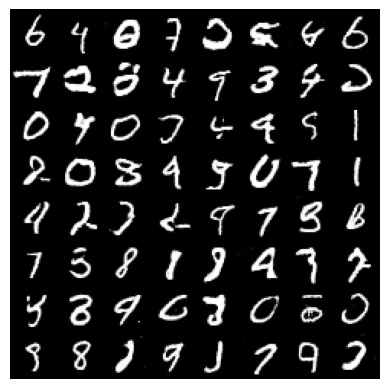

Epoch [92/100], Batch [100/938], D_real: 0.8966, D_fake: 0.0378, Loss_D: 0.1667, Loss_G: 3.9552
Epoch [92/100], Batch [200/938], D_real: 0.9958, D_fake: 0.3280, Loss_D: 0.6468, Loss_G: 4.1336
Epoch [92/100], Batch [300/938], D_real: 0.9813, D_fake: 0.1243, Loss_D: 0.2096, Loss_G: 3.8688
Epoch [92/100], Batch [400/938], D_real: 0.9268, D_fake: 0.0341, Loss_D: 0.1314, Loss_G: 4.4821
Epoch [92/100], Batch [500/938], D_real: 0.9229, D_fake: 0.0297, Loss_D: 0.1211, Loss_G: 5.1079
Epoch [92/100], Batch [600/938], D_real: 0.9083, D_fake: 0.0486, Loss_D: 0.1947, Loss_G: 4.8389
Epoch [92/100], Batch [700/938], D_real: 0.9259, D_fake: 0.0354, Loss_D: 0.1336, Loss_G: 5.4978
Epoch [92/100], Batch [800/938], D_real: 0.9199, D_fake: 0.0432, Loss_D: 0.1450, Loss_G: 5.7586
Epoch [92/100], Batch [900/938], D_real: 0.9284, D_fake: 0.0458, Loss_D: 0.1423, Loss_G: 5.3182


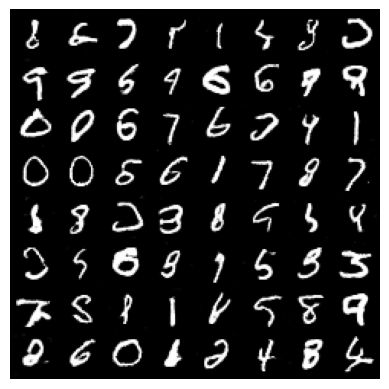

Epoch [93/100], Batch [100/938], D_real: 0.9697, D_fake: 0.0298, Loss_D: 0.0676, Loss_G: 5.7608
Epoch [93/100], Batch [200/938], D_real: 0.8733, D_fake: 0.0478, Loss_D: 0.2174, Loss_G: 4.3467
Epoch [93/100], Batch [300/938], D_real: 0.9729, D_fake: 0.1182, Loss_D: 0.2052, Loss_G: 4.8538
Epoch [93/100], Batch [400/938], D_real: 0.9806, D_fake: 0.0994, Loss_D: 0.1493, Loss_G: 3.7706
Epoch [93/100], Batch [500/938], D_real: 0.9772, D_fake: 0.2361, Loss_D: 0.3844, Loss_G: 2.7702
Epoch [93/100], Batch [600/938], D_real: 0.9821, D_fake: 0.0720, Loss_D: 0.1073, Loss_G: 4.4498
Epoch [93/100], Batch [700/938], D_real: 0.9789, D_fake: 0.0562, Loss_D: 0.0921, Loss_G: 4.8264
Epoch [93/100], Batch [800/938], D_real: 0.9392, D_fake: 0.1425, Loss_D: 0.2590, Loss_G: 3.9705
Epoch [93/100], Batch [900/938], D_real: 0.9320, D_fake: 0.0212, Loss_D: 0.0995, Loss_G: 4.3462


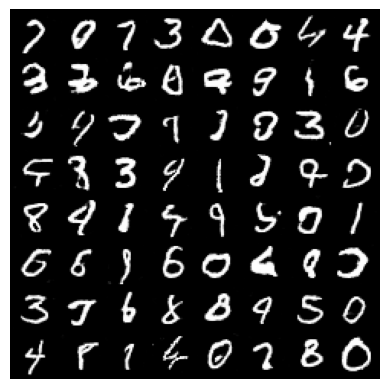

Epoch [94/100], Batch [100/938], D_real: 0.9944, D_fake: 0.1048, Loss_D: 0.1282, Loss_G: 4.2605
Epoch [94/100], Batch [200/938], D_real: 0.9310, D_fake: 0.0478, Loss_D: 0.1528, Loss_G: 4.9149
Epoch [94/100], Batch [300/938], D_real: 0.9087, D_fake: 0.0301, Loss_D: 0.1479, Loss_G: 3.6391
Epoch [94/100], Batch [400/938], D_real: 0.9960, D_fake: 0.2072, Loss_D: 0.3116, Loss_G: 3.2854
Epoch [94/100], Batch [500/938], D_real: 0.9634, D_fake: 0.1170, Loss_D: 0.1954, Loss_G: 4.3144
Epoch [94/100], Batch [600/938], D_real: 0.8312, D_fake: 0.0385, Loss_D: 0.2604, Loss_G: 4.5082
Epoch [94/100], Batch [700/938], D_real: 0.9487, D_fake: 0.0533, Loss_D: 0.1168, Loss_G: 3.8747
Epoch [94/100], Batch [800/938], D_real: 0.9505, D_fake: 0.0241, Loss_D: 0.0836, Loss_G: 6.3037
Epoch [94/100], Batch [900/938], D_real: 0.7754, D_fake: 0.0122, Loss_D: 0.3848, Loss_G: 3.5474


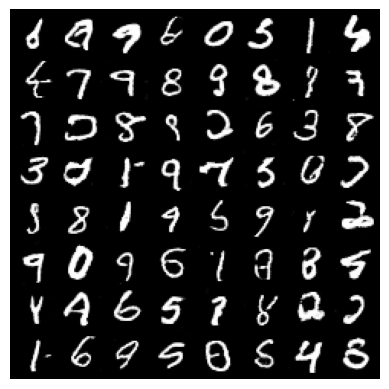

Epoch [95/100], Batch [100/938], D_real: 0.9501, D_fake: 0.0348, Loss_D: 0.0979, Loss_G: 3.8907
Epoch [95/100], Batch [200/938], D_real: 0.9375, D_fake: 0.0181, Loss_D: 0.0896, Loss_G: 5.6402
Epoch [95/100], Batch [300/938], D_real: 0.9006, D_fake: 0.0281, Loss_D: 0.1631, Loss_G: 5.4579
Epoch [95/100], Batch [400/938], D_real: 0.9462, D_fake: 0.0878, Loss_D: 0.1716, Loss_G: 4.3302
Epoch [95/100], Batch [500/938], D_real: 0.7133, D_fake: 0.0052, Loss_D: 0.4584, Loss_G: 5.0606
Epoch [95/100], Batch [600/938], D_real: 0.9779, D_fake: 0.0476, Loss_D: 0.0817, Loss_G: 4.9246
Epoch [95/100], Batch [700/938], D_real: 0.9390, D_fake: 0.1077, Loss_D: 0.2295, Loss_G: 3.2625
Epoch [95/100], Batch [800/938], D_real: 0.7794, D_fake: 0.0164, Loss_D: 0.3319, Loss_G: 4.8051
Epoch [95/100], Batch [900/938], D_real: 0.9263, D_fake: 0.0312, Loss_D: 0.1295, Loss_G: 4.2224


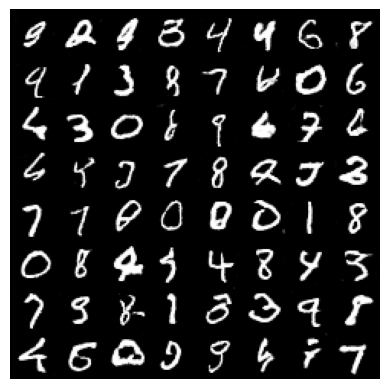

Epoch [96/100], Batch [100/938], D_real: 0.9876, D_fake: 0.0871, Loss_D: 0.1211, Loss_G: 4.3111
Epoch [96/100], Batch [200/938], D_real: 0.9184, D_fake: 0.0873, Loss_D: 0.2513, Loss_G: 4.9626
Epoch [96/100], Batch [300/938], D_real: 0.9745, D_fake: 0.0924, Loss_D: 0.1488, Loss_G: 3.3329
Epoch [96/100], Batch [400/938], D_real: 0.7532, D_fake: 0.0200, Loss_D: 0.4026, Loss_G: 4.2808
Epoch [96/100], Batch [500/938], D_real: 0.9549, D_fake: 0.0426, Loss_D: 0.1035, Loss_G: 4.7385
Epoch [96/100], Batch [600/938], D_real: 0.9789, D_fake: 0.1217, Loss_D: 0.1737, Loss_G: 3.7051
Epoch [96/100], Batch [700/938], D_real: 0.9961, D_fake: 0.2951, Loss_D: 0.5239, Loss_G: 3.8591
Epoch [96/100], Batch [800/938], D_real: 0.9089, D_fake: 0.0137, Loss_D: 0.1265, Loss_G: 5.8465
Epoch [96/100], Batch [900/938], D_real: 0.9910, D_fake: 0.1597, Loss_D: 0.2201, Loss_G: 3.6190


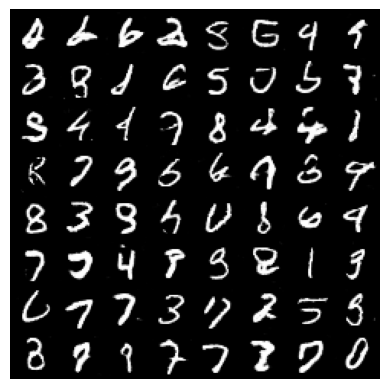

Epoch [97/100], Batch [100/938], D_real: 0.9390, D_fake: 0.0215, Loss_D: 0.1065, Loss_G: 6.1920
Epoch [97/100], Batch [200/938], D_real: 0.8753, D_fake: 0.0180, Loss_D: 0.1768, Loss_G: 4.8413
Epoch [97/100], Batch [300/938], D_real: 0.9926, D_fake: 0.1896, Loss_D: 0.2937, Loss_G: 2.7013
Epoch [97/100], Batch [400/938], D_real: 0.9652, D_fake: 0.0604, Loss_D: 0.1314, Loss_G: 4.2821
Epoch [97/100], Batch [500/938], D_real: 0.9311, D_fake: 0.0060, Loss_D: 0.0852, Loss_G: 6.1686
Epoch [97/100], Batch [600/938], D_real: 0.9169, D_fake: 0.0168, Loss_D: 0.1266, Loss_G: 4.8749
Epoch [97/100], Batch [700/938], D_real: 0.9645, D_fake: 0.0190, Loss_D: 0.0590, Loss_G: 4.7777
Epoch [97/100], Batch [800/938], D_real: 0.9695, D_fake: 0.0510, Loss_D: 0.0989, Loss_G: 5.4000
Epoch [97/100], Batch [900/938], D_real: 0.9226, D_fake: 0.0573, Loss_D: 0.1668, Loss_G: 3.8455


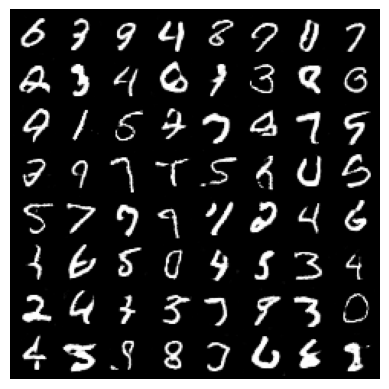

Epoch [98/100], Batch [100/938], D_real: 0.9897, D_fake: 0.0549, Loss_D: 0.0823, Loss_G: 5.2597
Epoch [98/100], Batch [200/938], D_real: 0.9886, D_fake: 0.0401, Loss_D: 0.0730, Loss_G: 5.6615
Epoch [98/100], Batch [300/938], D_real: 0.8831, D_fake: 0.0018, Loss_D: 0.1576, Loss_G: 7.4161
Epoch [98/100], Batch [400/938], D_real: 0.9880, D_fake: 0.2033, Loss_D: 0.3241, Loss_G: 3.2398
Epoch [98/100], Batch [500/938], D_real: 0.9987, D_fake: 0.3020, Loss_D: 0.6109, Loss_G: 2.3354
Epoch [98/100], Batch [600/938], D_real: 0.9692, D_fake: 0.0444, Loss_D: 0.0856, Loss_G: 4.2124
Epoch [98/100], Batch [700/938], D_real: 0.9898, D_fake: 0.0804, Loss_D: 0.1166, Loss_G: 3.6730
Epoch [98/100], Batch [800/938], D_real: 0.8956, D_fake: 0.0105, Loss_D: 0.1466, Loss_G: 5.8068
Epoch [98/100], Batch [900/938], D_real: 0.8652, D_fake: 0.0267, Loss_D: 0.1979, Loss_G: 4.1073


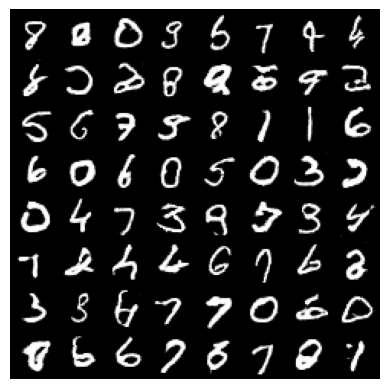

Epoch [99/100], Batch [100/938], D_real: 0.9498, D_fake: 0.1246, Loss_D: 0.2633, Loss_G: 3.8935
Epoch [99/100], Batch [200/938], D_real: 0.8564, D_fake: 0.0126, Loss_D: 0.2029, Loss_G: 7.5529
Epoch [99/100], Batch [300/938], D_real: 0.9966, D_fake: 0.0952, Loss_D: 0.1647, Loss_G: 3.3704
Epoch [99/100], Batch [400/938], D_real: 0.9875, D_fake: 0.3188, Loss_D: 0.6610, Loss_G: 3.0829
Epoch [99/100], Batch [500/938], D_real: 0.8275, D_fake: 0.0372, Loss_D: 0.2834, Loss_G: 5.1129
Epoch [99/100], Batch [600/938], D_real: 0.9803, D_fake: 0.0156, Loss_D: 0.0371, Loss_G: 6.3604
Epoch [99/100], Batch [700/938], D_real: 0.9295, D_fake: 0.1103, Loss_D: 0.2352, Loss_G: 4.6636
Epoch [99/100], Batch [800/938], D_real: 0.9519, D_fake: 0.0559, Loss_D: 0.1220, Loss_G: 5.2343
Epoch [99/100], Batch [900/938], D_real: 0.9674, D_fake: 0.0703, Loss_D: 0.1202, Loss_G: 5.1628


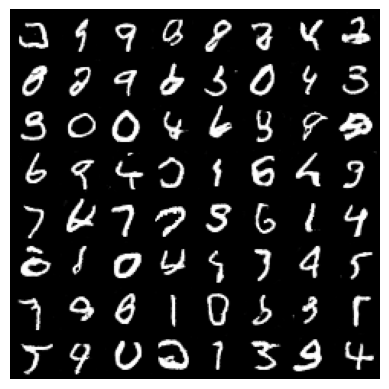

Epoch [100/100], Batch [100/938], D_real: 0.9799, D_fake: 0.0794, Loss_D: 0.1270, Loss_G: 4.8982
Epoch [100/100], Batch [200/938], D_real: 0.8444, D_fake: 0.0129, Loss_D: 0.2070, Loss_G: 4.4966
Epoch [100/100], Batch [300/938], D_real: 0.9892, D_fake: 0.0746, Loss_D: 0.0982, Loss_G: 3.6822
Epoch [100/100], Batch [400/938], D_real: 0.8104, D_fake: 0.0061, Loss_D: 0.3139, Loss_G: 7.2569
Epoch [100/100], Batch [500/938], D_real: 0.9530, D_fake: 0.1121, Loss_D: 0.2000, Loss_G: 4.0653
Epoch [100/100], Batch [600/938], D_real: 0.9632, D_fake: 0.0650, Loss_D: 0.1177, Loss_G: 5.7401
Epoch [100/100], Batch [700/938], D_real: 0.9970, D_fake: 0.1501, Loss_D: 0.2043, Loss_G: 3.5173
Epoch [100/100], Batch [800/938], D_real: 0.9894, D_fake: 0.0240, Loss_D: 0.0363, Loss_G: 5.3797
Epoch [100/100], Batch [900/938], D_real: 0.9751, D_fake: 0.0299, Loss_D: 0.0587, Loss_G: 5.1503


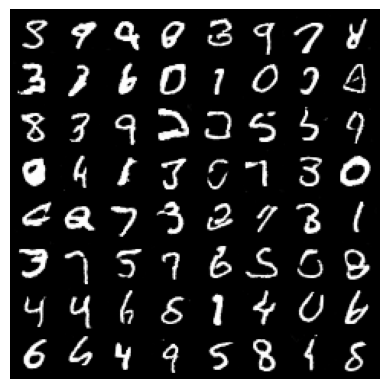

In [18]:
# Training loop
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(data_loader):
        real_images = real_images.cuda()
        batch_size = real_images.size(0)

        # Train discriminator with real images
        optimizer_d.zero_grad()
        label_real = torch.ones(batch_size, 1).cuda()
        output_real = discriminator(real_images).view(-1, 1)
        loss_real = criterion(output_real, label_real)
        loss_real.backward()

        # Train discriminator with fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1).cuda()
        fake_images = generator(noise)
        label_fake = torch.zeros(batch_size, 1).cuda()
        output_fake = discriminator(fake_images.detach()).view(-1, 1)
        loss_fake = criterion(output_fake, label_fake)
        loss_fake.backward()
        optimizer_d.step()

        # Train generator
        optimizer_g.zero_grad()
        output = discriminator(fake_images).view(-1, 1)
        loss_g = criterion(output, label_real)
        loss_g.backward()
        optimizer_g.step()

        if (i + 1) % 100 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{len(data_loader)}], '
                  f'D_real: {output_real.mean():.4f}, D_fake: {output_fake.mean():.4f}, '
                  f'Loss_D: {loss_real.item() + loss_fake.item():.4f}, Loss_G: {loss_g.item():.4f}')
            # Generate and save sample images at the end of each epoch
    with torch.no_grad():
        fake_samples = generator(torch.randn(64, latent_dim, 1, 1).cuda())
        fake_samples = fake_samples.cpu()
        fake_grid = torchvision.utils.make_grid(fake_samples, padding=2, normalize=True)
        plt.imshow(np.transpose(fake_grid, (1, 2, 0)))
        plt.axis('off')
        plt.show()